In [1]:
# run only once, otherwise GPU memory will not be collected correctly and cause memory leak.
# can also 'restart kernel' to clear out gpu memory
import numpy as np
import matplotlib.pyplot as plt
import pickle
# customized module

from hexomap import reconstruction  # g-force caller
from hexomap import MicFileTool     # io for reconstruction rst
from hexomap import IntBin          # io for binary image (reduced data)
from hexomap import config
#use 'nvidia-smi' in terminal to check gpu memory status
# create reconstructor that take data input and run reconstrution.
S = reconstruction.Reconstructor_GPU(gpuID=2) # use gpuID to choose which gpu to use

In [2]:
identifier = 'SS316_s1_cycle_3_cooldown_nf'

In [3]:
import os

lTiff = sorted(os.listdir(f'/media/heliu/suter_feb19/suter_feb20/nf/{identifier}/'))
nTiff = len(lTiff)
if nTiff==0:
    print('no file in folder!')
else:
    nLayer = nTiff/1440
    firstIdx = int(lTiff[0].split('.')[0][-6:])
    print(f'nTiff: {nTiff}, nLayer: {nLayer}, firstTiff: {lTiff[0]}, firstIdx: {firstIdx}')

nTiff: 51841, nLayer: 36.00069444444444, firstTiff: SS316_s1_cycle_3_cooldown_nf_119893.tif, firstIdx: 119893


In [6]:
c = config.Config().load('SS316_s1_cycle_1_cooldown_nf_1_z0_twiddle_4_0.883.yml') # read configuration file, create a configuration class:d
c.fileBin = f'/home/heliu/work/suter_feb20/{identifier}/reduction/{identifier}/{identifier}_binz'
c._initialString = identifier
c.micsize = np.array([50,50])
c.micVoxelSize = 0.01
print(c)
c.save(f'{identifier}_0.yml')

Loading configuration from SS316_s1_cycle_1_cooldown_nf_1_z0_twiddle_4_0.883.yml

Configurations:
NDet                           2
NRot                           720
_initialString                 SS316_s1_cycle_3_cooldown_nf
detJ                           [[1025.84600934 1044.28583237]]
detK                           [[1994.73690482 1990.09159792]]
detL                           [[5.61894496 7.61894496]]
detNJ                          [2048 2048]
detNK                          [2048 2048]
detPixelJ                      [0.00148 0.00148]
detPixelK                      [0.00148 0.00148]
detRot                         [[[89.19457841 89.53743871 -0.49491636]
  [89.30149268 89.34439197 -0.49276145]]]
energy                         76
etalimit                       1.413716694115407
fileBin                        /home/heliu/work/suter_feb20/SS316_s1_cycle_3_cooldown_nf/reduction/SS316_s1_cycle_3_cooldown_nf/SS316_s1_cycle_3_cooldown_nf_binz
fileBinDetIdx                  [0 1]
fileBinDigit

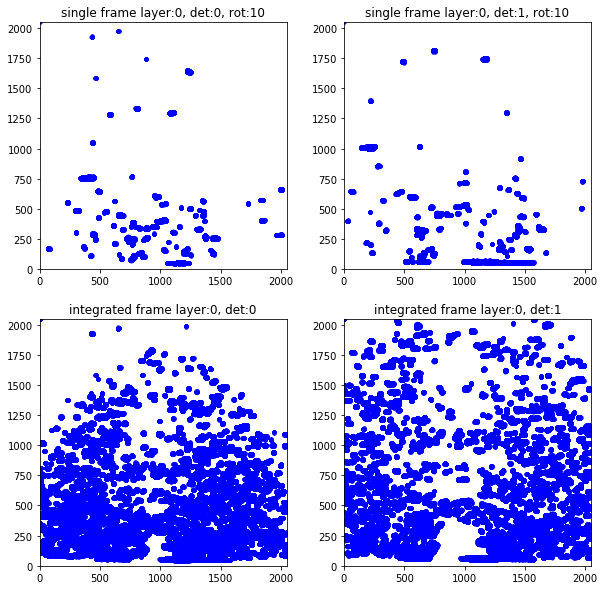

In [7]:
# check binary image
rawInitial = c.fileBin
NRot = 50   # number of images to display, doen't have to be all images(no need set to 180 or 720.can be some thing like 10)
NDet = 2 # number of detector
idxLayer = 0 # which layer
idxRot = 10 # 
# %matplotlib inline
# plt.rcParams["figure.figsize"] = (15,10)
# show binary images.
MicFileTool.plot_binary(rawInitial, NRot=NRot, NDet=NDet, idxRot=idxRot,idxLayer=idxLayer)

Loading configuration from SS316_s1_cycle_3_cooldown_nf_0.yml

Configurations:
NDet                           2
NRot                           720
_initialString                 SS316_s1_cycle_3_cooldown_nf
detJ                           [[1025.84600934 1044.28583237]]
detK                           [[1994.73690482 1990.09159792]]
detL                           [[5.61894496 7.61894496]]
detNJ                          [2048 2048]
detNK                          [2048 2048]
detPixelJ                      [0.00148 0.00148]
detPixelK                      [0.00148 0.00148]
detRot                         [[[89.19457841 89.53743871 -0.49491636]
  [89.30149268 89.34439197 -0.49276145]]]
energy                         76
etalimit                       1.413716694115407
fileBin                        /home/heliu/work/suter_feb20/SS316_s1_cycle_3_cooldown_nf/reduction/SS316_s1_cycle_3_cooldown_nf/SS316_s1_cycle_3_cooldown_nf_binz
fileBinDetIdx                  [0 1]
fileBinDigit                   

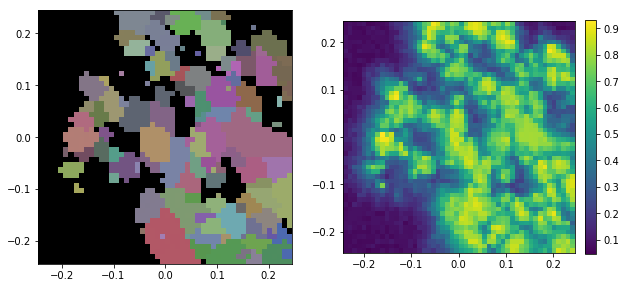

In [9]:
c = config.Config().load('SS316_s1_cycle_3_cooldown_nf_0.yml') # read configuration file, create a configuration class:d
c.micsize = np.array([50,50])
c.micVoxelSize = 0.01
print(c)

S.load_config(c,reloadData=True)
S.serial_recon_multi_stage()
MicFileTool.plot_mic_and_conf(S.squareMicData, 0.4)

cnt: 0, current threhold is 0.8299999999999998
 loss: 0.2415, sumdp: 0.0645, L: [[5.6189 7.6189]], J: 1025.85 1044.29, K: 1992.74 1990.09...   .9248 226.9764]
 loss: 0.2314, sumdp: 0.0539, L: [[5.6189 7.6189]], J: 1025.85 1044.29, K: 1992.74 1988.47...   .9248 226.9764]
 loss: 0.2298, sumdp: 0.0501, L: [[5.6189 7.6189]], J: 1025.85 1044.29, K: 1991.13 1988.47...   .9364 226.9433]
 loss: 0.2292, sumdp: 0.0309, L: [[5.6189 7.6189]], J: 1025.85 1042.35, K: 1991.13 1988.47...   .9248 226.9764]
 loss: 0.2288, sumdp: 0.0260, L: [[5.6189 7.6189]], J: 1025.85 1044.48, K: 1991.13 1988.47...   .9364 226.9433]
 loss: 0.2284, sumdp: 0.0232, L: [[5.6189 7.6189]], J: 1026.99 1044.48, K: 1991.13 1988.47...   .9364 226.9433]
 loss: 0.2279, sumdp: 0.0204, L: [[5.6189 7.6189]], J: 1025.86 1044.48, K: 1991.13 1988.47...   .9364 226.9433]
 loss: 0.2268, sumdp: 0.0066, L: [[5.6189 7.6189]], J: 1026.52 1044.48, K: 1991.13 1988.47...   .9364 226.9433]
 dp: [0.0005 0.0005 0.0005 0.0005 0.0005 0.0005] conf: 0.

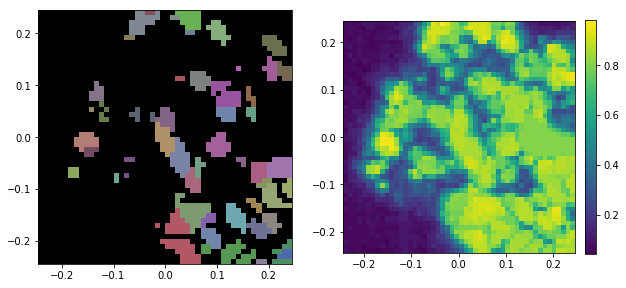

[[5.6189 7.6189]] [[1026.5194 1044.4795]] [[1991.1331 1988.4716]] [[[89.1071 89.3581 -0.4874]
  [89.1829 89.1831 -0.5163]]]
SS316_s1_cycle_3_cooldown_nf_z0_twiddle_0_0.922.yml
cnt: 1, current threhold is 0.8899999999999999
 loss: 0.1471, sumdp: 0.0696, L: [[5.6189 7.6189]], J: 1026.52 1039.98, K: 1991.13 1988.47...   .7737 262.558 ]
 loss: 0.1412, sumdp: 0.0623, L: [[5.6189 7.6189]], J: 1026.52 1044.93, K: 1991.13 1988.47...   .7885 262.5807]
 loss: 0.1377, sumdp: 0.0525, L: [[5.6189 7.6189]], J: 1026.52 1044.93, K: 1991.13 1987.52...   .7885 262.5807]
 loss: 0.1297, sumdp: 0.0513, L: [[5.6189 7.6189]], J: 1026.52 1044.93, K: 1991.13 1988.57...   .7885 262.5807]
 loss: 0.1294, sumdp: 0.0148, L: [[5.6189 7.6189]], J: 1026.52 1044.93, K: 1991.13 1988.16...   .7633 262.4772]
 loss: 0.1288, sumdp: 0.0095, L: [[5.6189 7.6189]], J: 1026.52 1043.68, K: 1991.13 1988.16...   .7885 262.5807]
 loss: 0.1251, sumdp: 0.0054, L: [[5.6166 7.6166]], J: 1026.52 1043.68, K: 1991.13 1988.16...   .7633 262

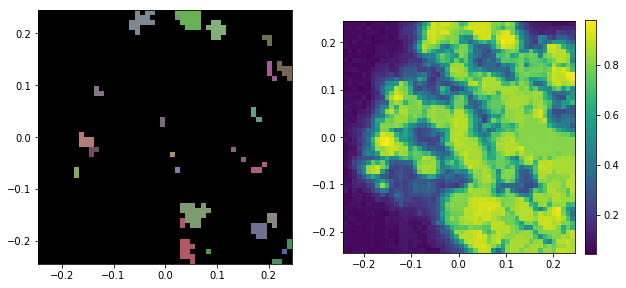

[[5.6166 7.6166]] [[1026.5194 1043.6839]] [[1991.1331 1988.1637]] [[[89.2413 89.5214 -0.5332]
  [89.1404 89.4047 -0.479 ]]]
SS316_s1_cycle_3_cooldown_nf_z0_twiddle_1_0.921.yml
cnt: 2, current threhold is 0.8899999999999999
 dp: [0.0005 0.0005 0.0005 0.0005 0.0005 0.0005] conf: 0.872340, pkcnt: 47, euler: [102.031    6.8017 274.6169]
twiddle takes: 117.99322032928467 seconds
maxQ: 9, minQ: 0, NG: 136
maxQ: 9, minQ: 0, NG: 136
 reset searchBatchSize into 6000
start reconstruction ... 

 flood filling ...001178, prog: 0001875/0002500, conf: 0.818182, pkcnt: 55, euler: [ 96.2664  65.9684 180.9582]

KeyboardInterrupt: 

In [10]:
S.auto_twiddle(0.95)

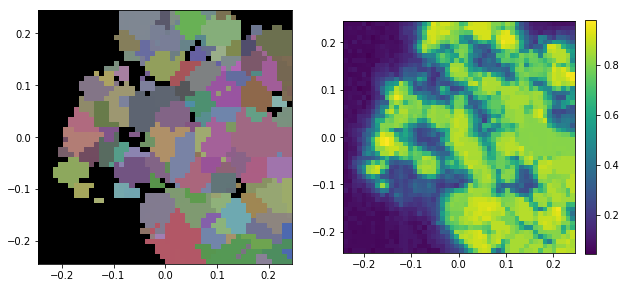

In [11]:
mic = np.load('SS316_s1_cycle_3_cooldown_nf_q9_rot720_z0_50x50_0.01_shift_0.0_0.0_0.0.npy')
MicFileTool.plot_mic_and_conf(mic, 0.3)

Loading configuration from SS316_s1_cycle_3_cooldown_nf_z0_twiddle_1_0.921.yml

Configurations:
NDet                           2
NRot                           720
_initialString                 SS316_s1_cycle_3_cooldown_nf
detJ                           [[1026.5194 1043.6839]]
detK                           [[1991.1331 1988.1637]]
detL                           [[5.6166 7.6166]]
detNJ                          [2048 2048]
detNK                          [2048 2048]
detPixelJ                      [0.0015 0.0015]
detPixelK                      [0.0015 0.0015]
detRot                         [[[89.2413 89.5214 -0.5332]
  [89.1404 89.4047 -0.479 ]]]
energy                         76
etalimit                       1.413716694115407
fileBin                        /home/heliu/work/suter_feb20/SS316_s1_cycle_3_cooldown_nf/reduction/SS316_s1_cycle_3_cooldown_nf/SS316_s1_cycle_3_cooldown_nf_binz
fileBinDetIdx                  [0 1]
fileBinDigit                   6
fileBinLayerIdx                0


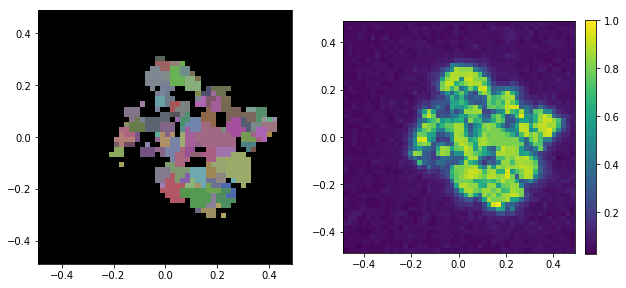

In [12]:
c = config.Config().load('SS316_s1_cycle_3_cooldown_nf_z0_twiddle_1_0.921.yml') # read configuration file, create a configuration class:d
c.micsize = np.array([50,50])
c.micVoxelSize = 0.02
print(c)

S.load_config(c,reloadData=True)
S.serial_recon_multi_stage()
MicFileTool.plot_mic_and_conf(S.squareMicData, 0.4)

## last layer

Loading configuration from SS316_s1_cycle_3_cooldown_nf_z0_twiddle_1_0.921.yml
try to clean up gpu memory
maxQ: 9, minQ: 0, NG: 136
maxQ: 9, minQ: 0, NG: 136
exp data loaded, shape is: (20838526, 4)./heliu/work/suter_feb20/SS316_s1_cycle_3_cooldown_nf/reduction/SS316_s1_cycle_3_cooldown_nf/SS316_s1_cycle_3_cooldown_nf_binz35_000719.bin1
copy exp data to gpu memory ...
start create exp data in cpu ram ...
 reset searchBatchSize into 6000
start reconstruction ... 

Niter: 20, vIdx: 0000451, prog: 0000001/0002500, conf: 0.050000, pkcnt: 40, euler: [129.0146  36.4282 274.0201]6e+02]
 
number of flood fills: 82
start post processing, moving grain boundaries untile stable ...
number of post process iteration: 6, number of voxel revisited: 1949
post process takes is 9.597 seconds
reconstruction finished 

SourceModule time:  97.651 seconds.
saved as npy format: SS316_s1_cycle_3_cooldown_nf_q9_rot720_z35_50x50_0.02_shift_0.0_0.0_0.0.npy


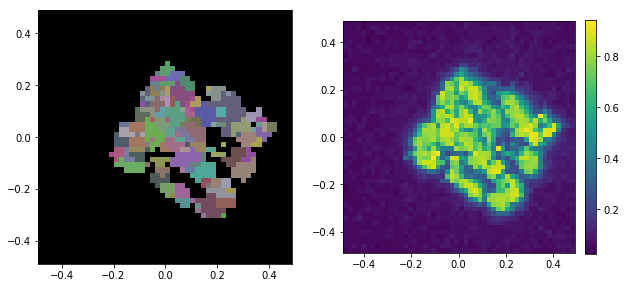

In [13]:
c = config.Config().load('SS316_s1_cycle_3_cooldown_nf_z0_twiddle_1_0.921.yml') # read configuration file, create a configuration class:d
c.micsize = np.array([50,50])
c.micVoxelSize = 0.02
c.fileBinLayerIdx = 35
#print(c)

S.load_config(c,reloadData=True)
S.serial_recon_multi_stage()
MicFileTool.plot_mic_and_conf(S.squareMicData, 0.4)

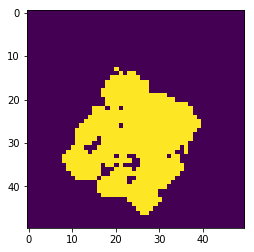

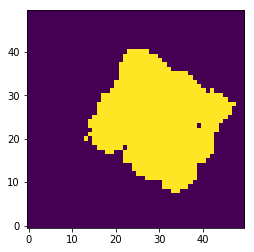

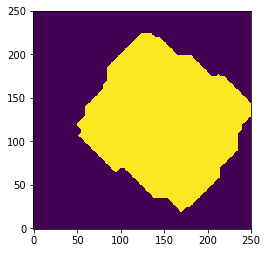

(250, 250)


In [19]:
NTime = 5
mic0 = np.load('SS316_s1_cycle_3_cooldown_nf_q9_rot720_z35_50x50_0.02_shift_0.0_0.0_0.0.npy')
mic1 = np.load('SS316_s1_cycle_3_cooldown_nf_q9_rot720_z0_50x50_0.02_shift_0.0_0.0_0.0.npy')
plt.imshow(mic0[:,:,6]>0.3)
plt.show()
mask = np.logical_or(mic0[:,:,6]>0.3,mic1[:,:,6]>0.3)
plt.imshow(mask.T, origin='lower')
plt.show()
mask = np.repeat(np.repeat(mask, NTime, axis=0),NTime, axis=1)
import scipy.ndimage as ndi
mask = ndi.binary_fill_holes(mask)
#mask = ndi.binary_closing(mask,iterations=10)
mask = ndi.binary_opening(mask,iterations=15)
mask = ndi.binary_dilation(mask, iterations=20)
plt.imshow(mask.T, origin='lower')
plt.show()
print(mask.shape)

In [20]:
c = config.Config().load('SS316_s1_cycle_3_cooldown_nf_z0_twiddle_1_0.921.yml') # read configuration file, create a configuration class:
c.micVoxelSize = 0.004
c.micsize = np.array([250, 250])
c.maxQ=9
c.micMask = mask
c.save(f'{identifier}_batch.yml') 
print(c)

Loading configuration from SS316_s1_cycle_3_cooldown_nf_z0_twiddle_1_0.921.yml

Configurations:
NDet                           2
NRot                           720
_initialString                 SS316_s1_cycle_3_cooldown_nf
detJ                           [[1026.5194 1043.6839]]
detK                           [[1991.1331 1988.1637]]
detL                           [[5.6166 7.6166]]
detNJ                          [2048 2048]
detNK                          [2048 2048]
detPixelJ                      [0.0015 0.0015]
detPixelK                      [0.0015 0.0015]
detRot                         [[[89.2413 89.5214 -0.5332]
  [89.1404 89.4047 -0.479 ]]]
energy                         76
etalimit                       1.413716694115407
fileBin                        /home/heliu/work/suter_feb20/SS316_s1_cycle_3_cooldown_nf/reduction/SS316_s1_cycle_3_cooldown_nf/SS316_s1_cycle_3_cooldown_nf_binz
fileBinDetIdx                  [0 1]
fileBinDigit                   6
fileBinLayerIdx                0


Loading configuration from SS316_s1_cycle_3_cooldown_nf_batch.yml
0
try to clean up gpu memory
maxQ: 9, minQ: 0, NG: 136
maxQ: 9, minQ: 0, NG: 136
exp data loaded, shape is: (23662864, 4)./heliu/work/suter_feb20/SS316_s1_cycle_3_cooldown_nf/reduction/SS316_s1_cycle_3_cooldown_nf/SS316_s1_cycle_3_cooldown_nf_binz0_000719.bin1
copy exp data to gpu memory ...
start create exp data in cpu ram ...
 reset searchBatchSize into 6000
start reconstruction ... 

Niter: 39, vIdx: 0046096, prog: 0000001/0024573, conf: 0.764706, pkcnt: 51, euler: [259.0328  50.2217  68.2   ]2e+02]
 
number of flood fills: 1011
start post processing, moving grain boundaries untile stable ...
number of post process iteration: 13, number of voxel revisited: 42435
post process takes is 215.222 seconds
reconstruction finished 

SourceModule time:  1093.331 seconds.
saved as npy format: SS316_s1_cycle_3_cooldown_nf_q9_rot720_z0_250x250_0.004_shift_0.0_0.0_0.0.npy


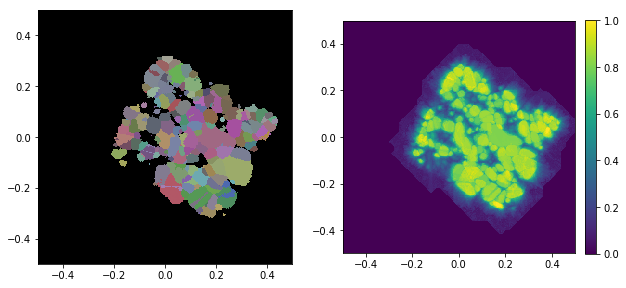

Loading configuration from SS316_s1_cycle_3_cooldown_nf_batch.yml
1
try to clean up gpu memory
maxQ: 9, minQ: 0, NG: 136
maxQ: 9, minQ: 0, NG: 136
exp data loaded, shape is: (24107404, 4)./heliu/work/suter_feb20/SS316_s1_cycle_3_cooldown_nf/reduction/SS316_s1_cycle_3_cooldown_nf/SS316_s1_cycle_3_cooldown_nf_binz1_000719.bin1
copy exp data to gpu memory ...
start create exp data in cpu ram ...
 reset searchBatchSize into 6000
start reconstruction ... 

 flood filling ...041841, prog: 0000001/0024573, conf: 0.826923, pkcnt: 52, euler: [138.3239  66.9199 195.6311]5e-02]
 
number of flood fills: 1048
start post processing, moving grain boundaries untile stable ...
number of post process iteration: 14, number of voxel revisited: 42528
post process takes is 219.655 seconds
reconstruction finished 

SourceModule time:  1086.957 seconds.
saved as npy format: SS316_s1_cycle_3_cooldown_nf_q9_rot720_z1_250x250_0.004_shift_0.0_0.0_0.0.npy


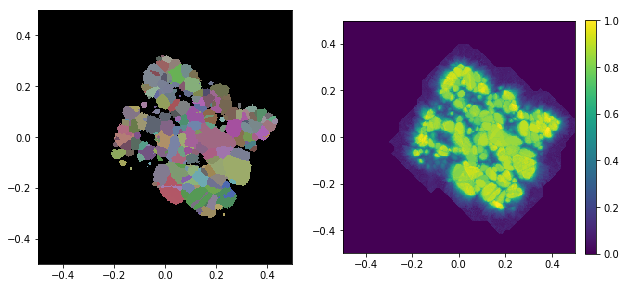

Loading configuration from SS316_s1_cycle_3_cooldown_nf_batch.yml
2
try to clean up gpu memory
maxQ: 9, minQ: 0, NG: 136
maxQ: 9, minQ: 0, NG: 136
exp data loaded, shape is: (24190411, 4)./heliu/work/suter_feb20/SS316_s1_cycle_3_cooldown_nf/reduction/SS316_s1_cycle_3_cooldown_nf/SS316_s1_cycle_3_cooldown_nf_binz2_000719.bin1
copy exp data to gpu memory ...
start create exp data in cpu ram ...
 reset searchBatchSize into 6000
start reconstruction ... 

Niter: 20, vIdx: 0032907, prog: 0000001/0024573, conf: 0.792453, pkcnt: 53, euler: [196.3457  18.2246 172.3478]6e+02]
 
number of flood fills: 1091
start post processing, moving grain boundaries untile stable ...
number of post process iteration: 9, number of voxel revisited: 42874
post process takes is 221.555 seconds
reconstruction finished 

SourceModule time:  1097.830 seconds.
saved as npy format: SS316_s1_cycle_3_cooldown_nf_q9_rot720_z2_250x250_0.004_shift_0.0_0.0_0.0.npy


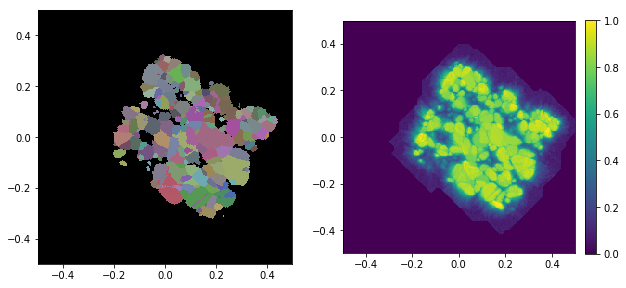

Loading configuration from SS316_s1_cycle_3_cooldown_nf_batch.yml
3
try to clean up gpu memory
maxQ: 9, minQ: 0, NG: 136
maxQ: 9, minQ: 0, NG: 136
exp data loaded, shape is: (24488623, 4)./heliu/work/suter_feb20/SS316_s1_cycle_3_cooldown_nf/reduction/SS316_s1_cycle_3_cooldown_nf/SS316_s1_cycle_3_cooldown_nf_binz3_000719.bin1
copy exp data to gpu memory ...
start create exp data in cpu ram ...
 reset searchBatchSize into 6000
start reconstruction ... 

Niter: 20, vIdx: 0057593, prog: 0000001/0024573, conf: 0.066667, pkcnt: 45, euler: [ 94.2665  20.2919 276.6315]0e-02]
 
number of flood fills: 1261
start post processing, moving grain boundaries untile stable ...
number of post process iteration: 14, number of voxel revisited: 43997
post process takes is 230.763 seconds
reconstruction finished 

SourceModule time:  1132.371 seconds.
saved as npy format: SS316_s1_cycle_3_cooldown_nf_q9_rot720_z3_250x250_0.004_shift_0.0_0.0_0.0.npy


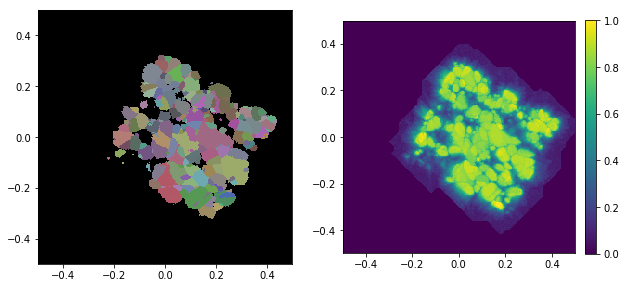

Loading configuration from SS316_s1_cycle_3_cooldown_nf_batch.yml
4
try to clean up gpu memory
maxQ: 9, minQ: 0, NG: 136
maxQ: 9, minQ: 0, NG: 136
exp data loaded, shape is: (24614764, 4)./heliu/work/suter_feb20/SS316_s1_cycle_3_cooldown_nf/reduction/SS316_s1_cycle_3_cooldown_nf/SS316_s1_cycle_3_cooldown_nf_binz4_000719.bin1
copy exp data to gpu memory ...
start create exp data in cpu ram ...
 reset searchBatchSize into 6000
start reconstruction ... 

Niter: 20, vIdx: 0060651, prog: 0000001/0024573, conf: 0.068182, pkcnt: 44, euler: [294.2474  30.1073 121.1427]7e-01]
 
number of flood fills: 1298
start post processing, moving grain boundaries untile stable ...
number of post process iteration: 11, number of voxel revisited: 44504
post process takes is 230.537 seconds
reconstruction finished 

SourceModule time:  1158.126 seconds.
saved as npy format: SS316_s1_cycle_3_cooldown_nf_q9_rot720_z4_250x250_0.004_shift_0.0_0.0_0.0.npy


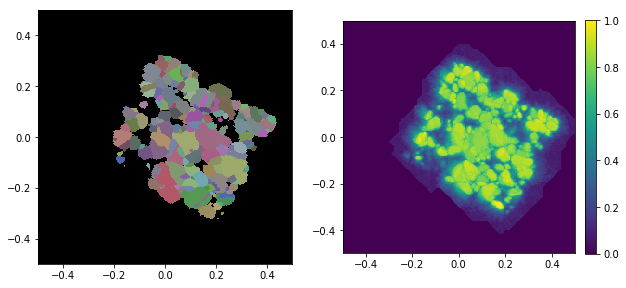

Loading configuration from SS316_s1_cycle_3_cooldown_nf_batch.yml
5
try to clean up gpu memory
maxQ: 9, minQ: 0, NG: 136
maxQ: 9, minQ: 0, NG: 136
exp data loaded, shape is: (25085142, 4)./heliu/work/suter_feb20/SS316_s1_cycle_3_cooldown_nf/reduction/SS316_s1_cycle_3_cooldown_nf/SS316_s1_cycle_3_cooldown_nf_binz5_000719.bin1
copy exp data to gpu memory ...
start create exp data in cpu ram ...
 reset searchBatchSize into 6000
start reconstruction ... 

Niter: 18, vIdx: 0057411, prog: 0000001/0024573, conf: 0.080000, pkcnt: 50, euler: [ 72.456   55.7279 316.5343]8e-02]
 
number of flood fills: 1241
start post processing, moving grain boundaries untile stable ...
number of post process iteration: 15, number of voxel revisited: 45308
post process takes is 234.378 seconds
reconstruction finished 

SourceModule time:  1200.118 seconds.
saved as npy format: SS316_s1_cycle_3_cooldown_nf_q9_rot720_z5_250x250_0.004_shift_0.0_0.0_0.0.npy


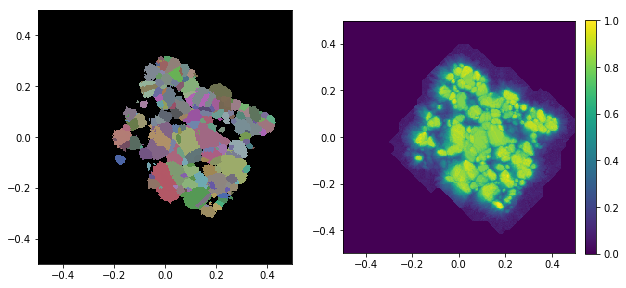

Loading configuration from SS316_s1_cycle_3_cooldown_nf_batch.yml
6
try to clean up gpu memory
maxQ: 9, minQ: 0, NG: 136
maxQ: 9, minQ: 0, NG: 136
exp data loaded, shape is: (25677811, 4)./heliu/work/suter_feb20/SS316_s1_cycle_3_cooldown_nf/reduction/SS316_s1_cycle_3_cooldown_nf/SS316_s1_cycle_3_cooldown_nf_binz6_000719.bin1
copy exp data to gpu memory ...
start create exp data in cpu ram ...
 reset searchBatchSize into 6000
start reconstruction ... 

Niter: 22, vIdx: 0038383, prog: 0000001/0024573, conf: 0.132075, pkcnt: 53, euler: [ 73.8259  47.2356 333.5289]4e+02]
 
number of flood fills: 1103
start post processing, moving grain boundaries untile stable ...
number of post process iteration: 16, number of voxel revisited: 46158
post process takes is 237.057 seconds
reconstruction finished 

SourceModule time:  1226.908 seconds.
saved as npy format: SS316_s1_cycle_3_cooldown_nf_q9_rot720_z6_250x250_0.004_shift_0.0_0.0_0.0.npy


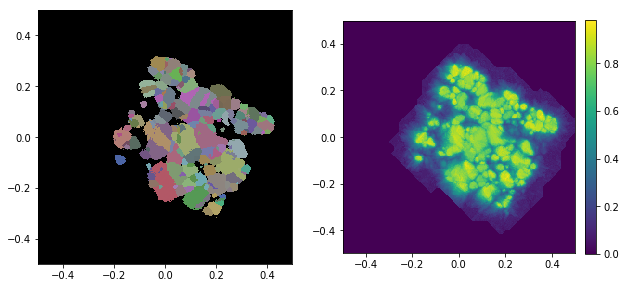

Loading configuration from SS316_s1_cycle_3_cooldown_nf_batch.yml
7
try to clean up gpu memory
maxQ: 9, minQ: 0, NG: 136
maxQ: 9, minQ: 0, NG: 136
exp data loaded, shape is: (26044245, 4)./heliu/work/suter_feb20/SS316_s1_cycle_3_cooldown_nf/reduction/SS316_s1_cycle_3_cooldown_nf/SS316_s1_cycle_3_cooldown_nf_binz7_000719.bin1
copy exp data to gpu memory ...
start create exp data in cpu ram ...
 reset searchBatchSize into 6000
start reconstruction ... 

Niter: 17, vIdx: 0033413, prog: 0000001/0024573, conf: 0.081633, pkcnt: 49, euler: [  0.       0.     294.6293]1e-01]
 
number of flood fills: 821
start post processing, moving grain boundaries untile stable ...
number of post process iteration: 14, number of voxel revisited: 47332
post process takes is 254.957 seconds
reconstruction finished 

SourceModule time:  1259.859 seconds.
saved as npy format: SS316_s1_cycle_3_cooldown_nf_q9_rot720_z7_250x250_0.004_shift_0.0_0.0_0.0.npy


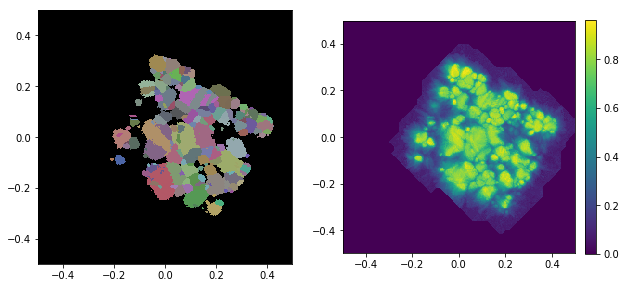

Loading configuration from SS316_s1_cycle_3_cooldown_nf_batch.yml
8
try to clean up gpu memory
maxQ: 9, minQ: 0, NG: 136
maxQ: 9, minQ: 0, NG: 136
exp data loaded, shape is: (26302458, 4)./heliu/work/suter_feb20/SS316_s1_cycle_3_cooldown_nf/reduction/SS316_s1_cycle_3_cooldown_nf/SS316_s1_cycle_3_cooldown_nf_binz8_000719.bin1
copy exp data to gpu memory ...
start create exp data in cpu ram ...
 reset searchBatchSize into 6000
start reconstruction ... 

Niter: 23, vIdx: 0032066, prog: 0000001/0024573, conf: 0.423077, pkcnt: 52, euler: [171.1736  44.8371 149.2897]4e+02]
 
number of flood fills: 717
start post processing, moving grain boundaries untile stable ...
number of post process iteration: 15, number of voxel revisited: 49444
post process takes is 318.111 seconds
reconstruction finished 

SourceModule time:  1349.186 seconds.
saved as npy format: SS316_s1_cycle_3_cooldown_nf_q9_rot720_z8_250x250_0.004_shift_0.0_0.0_0.0.npy


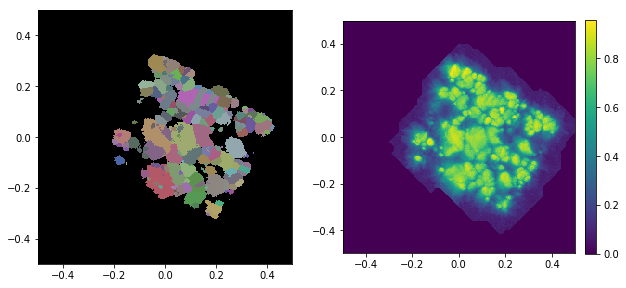

Loading configuration from SS316_s1_cycle_3_cooldown_nf_batch.yml
9
try to clean up gpu memory
maxQ: 9, minQ: 0, NG: 136
maxQ: 9, minQ: 0, NG: 136
exp data loaded, shape is: (26525359, 4)./heliu/work/suter_feb20/SS316_s1_cycle_3_cooldown_nf/reduction/SS316_s1_cycle_3_cooldown_nf/SS316_s1_cycle_3_cooldown_nf_binz9_000719.bin1
copy exp data to gpu memory ...
start create exp data in cpu ram ...
 reset searchBatchSize into 6000
start reconstruction ... 

Niter: 18, vIdx: 0020161, prog: 0000001/0024573, conf: 0.090909, pkcnt: 44, euler: [125.735   37.9723 146.8896]4e-01]
 
number of flood fills: 540
start post processing, moving grain boundaries untile stable ...
number of post process iteration: 21, number of voxel revisited: 50160
post process takes is 289.020 seconds
reconstruction finished 

SourceModule time:  1324.144 seconds.
saved as npy format: SS316_s1_cycle_3_cooldown_nf_q9_rot720_z9_250x250_0.004_shift_0.0_0.0_0.0.npy


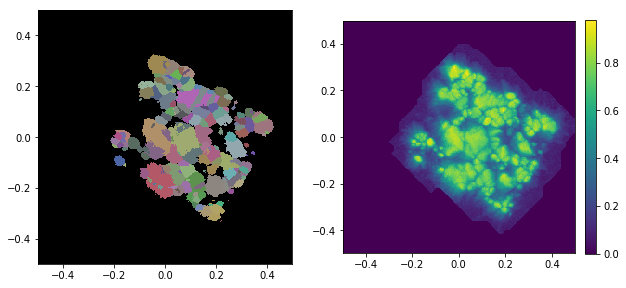

Loading configuration from SS316_s1_cycle_3_cooldown_nf_batch.yml
10
try to clean up gpu memory
maxQ: 9, minQ: 0, NG: 136
maxQ: 9, minQ: 0, NG: 136
exp data loaded, shape is: (27100681, 4)./heliu/work/suter_feb20/SS316_s1_cycle_3_cooldown_nf/reduction/SS316_s1_cycle_3_cooldown_nf/SS316_s1_cycle_3_cooldown_nf_binz10_000719.bin1
copy exp data to gpu memory ...
start create exp data in cpu ram ...
 reset searchBatchSize into 6000
start reconstruction ... 

Niter: 28, vIdx: 0058343, prog: 0000001/0024573, conf: 0.071429, pkcnt: 42, euler: [260.6517  36.1239  88.9771]0e+02]
 
number of flood fills: 792
start post processing, moving grain boundaries untile stable ...
number of post process iteration: 13, number of voxel revisited: 49473
post process takes is 276.893 seconds
reconstruction finished 

SourceModule time:  1299.642 seconds.
saved as npy format: SS316_s1_cycle_3_cooldown_nf_q9_rot720_z10_250x250_0.004_shift_0.0_0.0_0.0.npy


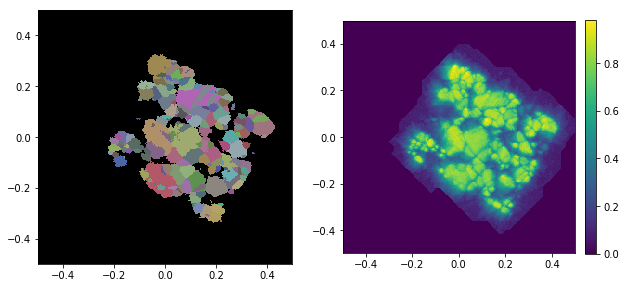

Loading configuration from SS316_s1_cycle_3_cooldown_nf_batch.yml
11
try to clean up gpu memory
maxQ: 9, minQ: 0, NG: 136
maxQ: 9, minQ: 0, NG: 136
exp data loaded, shape is: (25738530, 4)./heliu/work/suter_feb20/SS316_s1_cycle_3_cooldown_nf/reduction/SS316_s1_cycle_3_cooldown_nf/SS316_s1_cycle_3_cooldown_nf_binz11_000719.bin1
copy exp data to gpu memory ...
start create exp data in cpu ram ...
 reset searchBatchSize into 6000
start reconstruction ... 

Niter: 28, vIdx: 0055861, prog: 0000001/0024573, conf: 0.120000, pkcnt: 50, euler: [ 16.0533  32.336  356.4697]0e+02]
 
number of flood fills: 1043
start post processing, moving grain boundaries untile stable ...
number of post process iteration: 12, number of voxel revisited: 48176
post process takes is 268.590 seconds
reconstruction finished 

SourceModule time:  1269.178 seconds.
saved as npy format: SS316_s1_cycle_3_cooldown_nf_q9_rot720_z11_250x250_0.004_shift_0.0_0.0_0.0.npy


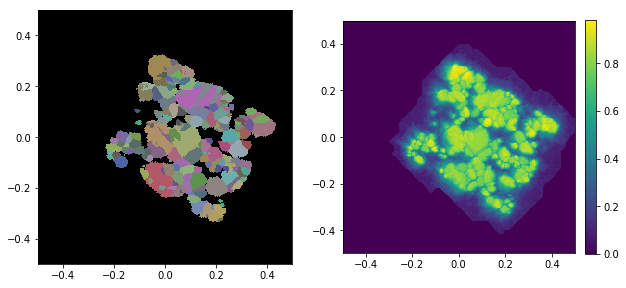

Loading configuration from SS316_s1_cycle_3_cooldown_nf_batch.yml
12
try to clean up gpu memory
maxQ: 9, minQ: 0, NG: 136
maxQ: 9, minQ: 0, NG: 136
exp data loaded, shape is: (24864344, 4)./heliu/work/suter_feb20/SS316_s1_cycle_3_cooldown_nf/reduction/SS316_s1_cycle_3_cooldown_nf/SS316_s1_cycle_3_cooldown_nf_binz12_000719.bin1
copy exp data to gpu memory ...
start create exp data in cpu ram ...
 reset searchBatchSize into 6000
start reconstruction ... 

Niter: 20, vIdx: 0031433, prog: 0000001/0024573, conf: 0.122449, pkcnt: 49, euler: [ 95.7699  11.832  267.2299]7e-02]
 
number of flood fills: 1107
start post processing, moving grain boundaries untile stable ...
number of post process iteration: 10, number of voxel revisited: 47726
post process takes is 250.740 seconds
reconstruction finished 

SourceModule time:  1207.764 seconds.
saved as npy format: SS316_s1_cycle_3_cooldown_nf_q9_rot720_z12_250x250_0.004_shift_0.0_0.0_0.0.npy


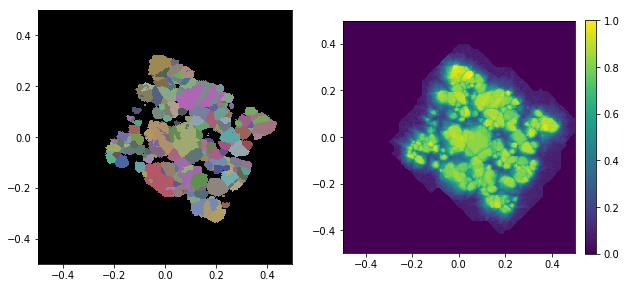

Loading configuration from SS316_s1_cycle_3_cooldown_nf_batch.yml
13
try to clean up gpu memory
maxQ: 9, minQ: 0, NG: 136
maxQ: 9, minQ: 0, NG: 136
exp data loaded, shape is: (24264014, 4)./heliu/work/suter_feb20/SS316_s1_cycle_3_cooldown_nf/reduction/SS316_s1_cycle_3_cooldown_nf/SS316_s1_cycle_3_cooldown_nf_binz13_000719.bin1
copy exp data to gpu memory ...
start create exp data in cpu ram ...
 reset searchBatchSize into 6000
start reconstruction ... 

Niter: 23, vIdx: 0057612, prog: 0000001/0024573, conf: 0.100000, pkcnt: 50, euler: [12.0878 29.8411  2.8723]18]0e+01]
 
number of flood fills: 1184
start post processing, moving grain boundaries untile stable ...
number of post process iteration: 11, number of voxel revisited: 47236
post process takes is 250.409 seconds
reconstruction finished 

SourceModule time:  1187.908 seconds.
saved as npy format: SS316_s1_cycle_3_cooldown_nf_q9_rot720_z13_250x250_0.004_shift_0.0_0.0_0.0.npy


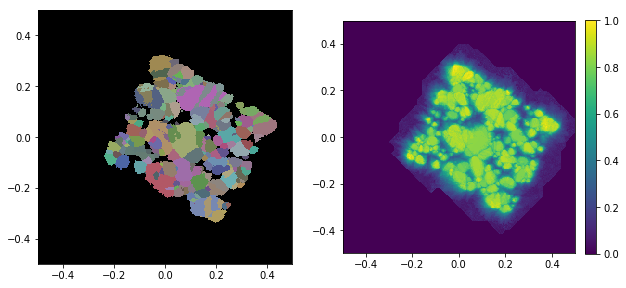

Loading configuration from SS316_s1_cycle_3_cooldown_nf_batch.yml
14
try to clean up gpu memory
maxQ: 9, minQ: 0, NG: 136
maxQ: 9, minQ: 0, NG: 136
exp data loaded, shape is: (23695600, 4)./heliu/work/suter_feb20/SS316_s1_cycle_3_cooldown_nf/reduction/SS316_s1_cycle_3_cooldown_nf/SS316_s1_cycle_3_cooldown_nf_binz14_000719.bin1
copy exp data to gpu memory ...
start create exp data in cpu ram ...
 reset searchBatchSize into 6000
start reconstruction ... 

Niter: 17, vIdx: 0053081, prog: 0000001/0024573, conf: 0.069767, pkcnt: 43, euler: [182.2854  38.0629 179.7209]0e+02]
 
number of flood fills: 1448
start post processing, moving grain boundaries untile stable ...
number of post process iteration: 10, number of voxel revisited: 46364
post process takes is 247.418 seconds
reconstruction finished 

SourceModule time:  1168.369 seconds.
saved as npy format: SS316_s1_cycle_3_cooldown_nf_q9_rot720_z14_250x250_0.004_shift_0.0_0.0_0.0.npy


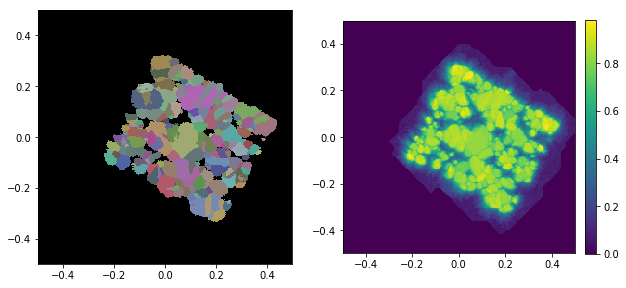

Loading configuration from SS316_s1_cycle_3_cooldown_nf_batch.yml
15
try to clean up gpu memory
maxQ: 9, minQ: 0, NG: 136
maxQ: 9, minQ: 0, NG: 136
exp data loaded, shape is: (23057716, 4)./heliu/work/suter_feb20/SS316_s1_cycle_3_cooldown_nf/reduction/SS316_s1_cycle_3_cooldown_nf/SS316_s1_cycle_3_cooldown_nf_binz15_000719.bin1
copy exp data to gpu memory ...
start create exp data in cpu ram ...
 reset searchBatchSize into 6000
start reconstruction ... 

Niter: 22, vIdx: 0043401, prog: 0000001/0024573, conf: 0.711538, pkcnt: 52, euler: [245.5367  34.7257 142.6234]7e+02]
 
number of flood fills: 1563
start post processing, moving grain boundaries untile stable ...
number of post process iteration: 10, number of voxel revisited: 46700
post process takes is 252.096 seconds
reconstruction finished 

SourceModule time:  1161.789 seconds.
saved as npy format: SS316_s1_cycle_3_cooldown_nf_q9_rot720_z15_250x250_0.004_shift_0.0_0.0_0.0.npy


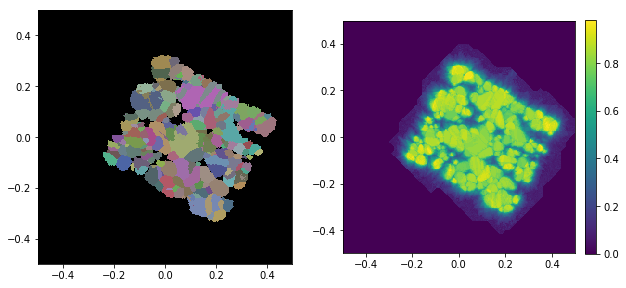

Loading configuration from SS316_s1_cycle_3_cooldown_nf_batch.yml
16
try to clean up gpu memory
maxQ: 9, minQ: 0, NG: 136
maxQ: 9, minQ: 0, NG: 136
exp data loaded, shape is: (22642002, 4)./heliu/work/suter_feb20/SS316_s1_cycle_3_cooldown_nf/reduction/SS316_s1_cycle_3_cooldown_nf/SS316_s1_cycle_3_cooldown_nf_binz16_000719.bin1
copy exp data to gpu memory ...
start create exp data in cpu ram ...
 reset searchBatchSize into 6000
start reconstruction ... 

 flood filling ...041398, prog: 0000001/0024573, conf: 0.862745, pkcnt: 51, euler: [317.784   43.8652  33.7792]9e+02]
 
number of flood fills: 1582
start post processing, moving grain boundaries untile stable ...
number of post process iteration: 19, number of voxel revisited: 45962
post process takes is 254.200 seconds
reconstruction finished 

SourceModule time:  1160.502 seconds.
saved as npy format: SS316_s1_cycle_3_cooldown_nf_q9_rot720_z16_250x250_0.004_shift_0.0_0.0_0.0.npy


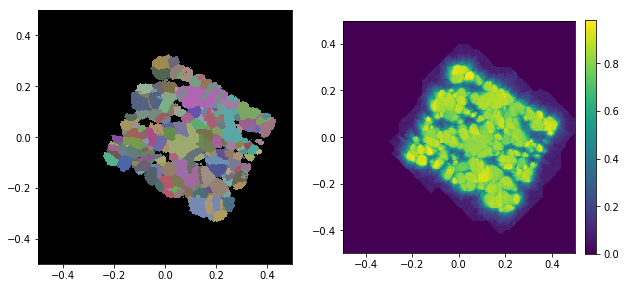

Loading configuration from SS316_s1_cycle_3_cooldown_nf_batch.yml
17
try to clean up gpu memory
maxQ: 9, minQ: 0, NG: 136
maxQ: 9, minQ: 0, NG: 136
exp data loaded, shape is: (22567181, 4)./heliu/work/suter_feb20/SS316_s1_cycle_3_cooldown_nf/reduction/SS316_s1_cycle_3_cooldown_nf/SS316_s1_cycle_3_cooldown_nf_binz17_000719.bin1
copy exp data to gpu memory ...
start create exp data in cpu ram ...
 reset searchBatchSize into 6000
start reconstruction ... 

Niter: 26, vIdx: 0033207, prog: 0000001/0024573, conf: 0.239130, pkcnt: 46, euler: [227.8965  25.705  125.3291]6e-02]
 
number of flood fills: 1619
start post processing, moving grain boundaries untile stable ...
number of post process iteration: 11, number of voxel revisited: 46337
post process takes is 254.574 seconds
reconstruction finished 

SourceModule time:  1158.986 seconds.
saved as npy format: SS316_s1_cycle_3_cooldown_nf_q9_rot720_z17_250x250_0.004_shift_0.0_0.0_0.0.npy


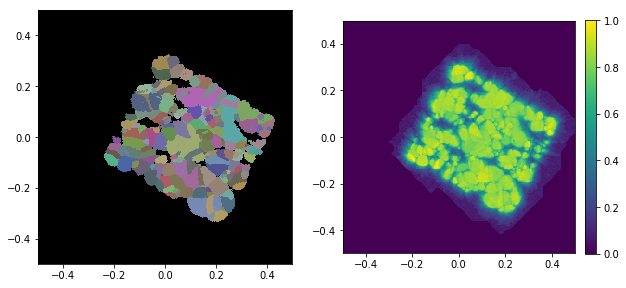

Loading configuration from SS316_s1_cycle_3_cooldown_nf_batch.yml
18
try to clean up gpu memory
maxQ: 9, minQ: 0, NG: 136
maxQ: 9, minQ: 0, NG: 136
exp data loaded, shape is: (22537857, 4)./heliu/work/suter_feb20/SS316_s1_cycle_3_cooldown_nf/reduction/SS316_s1_cycle_3_cooldown_nf/SS316_s1_cycle_3_cooldown_nf_binz18_000719.bin1
copy exp data to gpu memory ...
start create exp data in cpu ram ...
 reset searchBatchSize into 6000
start reconstruction ... 

Niter: 29, vIdx: 0046411, prog: 0000001/0024573, conf: 0.207547, pkcnt: 53, euler: [ 60.8793  24.8121 272.0899]2e+02]
 
number of flood fills: 1610
start post processing, moving grain boundaries untile stable ...
number of post process iteration: 12, number of voxel revisited: 46234
post process takes is 245.057 seconds
reconstruction finished 

SourceModule time:  1147.327 seconds.
saved as npy format: SS316_s1_cycle_3_cooldown_nf_q9_rot720_z18_250x250_0.004_shift_0.0_0.0_0.0.npy


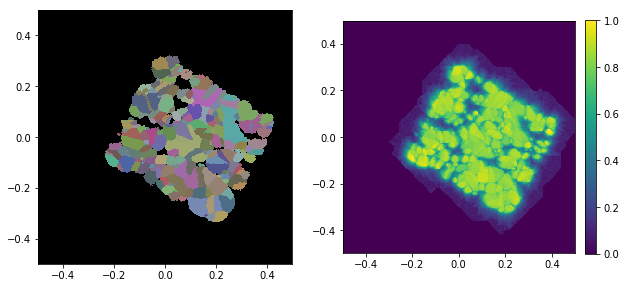

Loading configuration from SS316_s1_cycle_3_cooldown_nf_batch.yml
19
try to clean up gpu memory
maxQ: 9, minQ: 0, NG: 136
maxQ: 9, minQ: 0, NG: 136
exp data loaded, shape is: (22297780, 4)./heliu/work/suter_feb20/SS316_s1_cycle_3_cooldown_nf/reduction/SS316_s1_cycle_3_cooldown_nf/SS316_s1_cycle_3_cooldown_nf_binz19_000719.bin1
copy exp data to gpu memory ...
start create exp data in cpu ram ...
 reset searchBatchSize into 6000
start reconstruction ... 

Niter: 26, vIdx: 0041837, prog: 0000001/0024573, conf: 0.156863, pkcnt: 51, euler: [137.8357  37.8733 229.6615]9e+02]
 
number of flood fills: 1474
start post processing, moving grain boundaries untile stable ...
number of post process iteration: 12, number of voxel revisited: 45610
post process takes is 239.816 seconds
reconstruction finished 

SourceModule time:  1137.344 seconds.
saved as npy format: SS316_s1_cycle_3_cooldown_nf_q9_rot720_z19_250x250_0.004_shift_0.0_0.0_0.0.npy


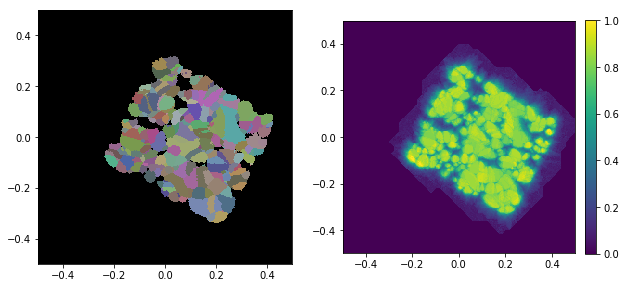

Loading configuration from SS316_s1_cycle_3_cooldown_nf_batch.yml
20
try to clean up gpu memory
maxQ: 9, minQ: 0, NG: 136
maxQ: 9, minQ: 0, NG: 136
exp data loaded, shape is: (22274434, 4)./heliu/work/suter_feb20/SS316_s1_cycle_3_cooldown_nf/reduction/SS316_s1_cycle_3_cooldown_nf/SS316_s1_cycle_3_cooldown_nf_binz20_000719.bin1
copy exp data to gpu memory ...
start create exp data in cpu ram ...
 reset searchBatchSize into 6000
start reconstruction ... 

Niter: 23, vIdx: 0051090, prog: 0000001/0024573, conf: 0.180000, pkcnt: 50, euler: [169.6749  52.2271 237.8307]5e-01]
 
number of flood fills: 1380
start post processing, moving grain boundaries untile stable ...
number of post process iteration: 11, number of voxel revisited: 44912
post process takes is 236.175 seconds
reconstruction finished 

SourceModule time:  1140.452 seconds.
saved as npy format: SS316_s1_cycle_3_cooldown_nf_q9_rot720_z20_250x250_0.004_shift_0.0_0.0_0.0.npy


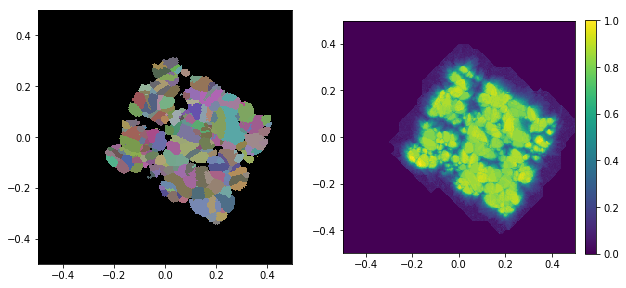

Loading configuration from SS316_s1_cycle_3_cooldown_nf_batch.yml
21
try to clean up gpu memory
maxQ: 9, minQ: 0, NG: 136
maxQ: 9, minQ: 0, NG: 136
exp data loaded, shape is: (22230654, 4)./heliu/work/suter_feb20/SS316_s1_cycle_3_cooldown_nf/reduction/SS316_s1_cycle_3_cooldown_nf/SS316_s1_cycle_3_cooldown_nf_binz21_000719.bin1
copy exp data to gpu memory ...
start create exp data in cpu ram ...
 reset searchBatchSize into 6000
start reconstruction ... 

Niter: 31, vIdx: 0042635, prog: 0000001/0024573, conf: 0.392157, pkcnt: 51, euler: [ 66.7863  27.2906 263.064 ]2e+02]
 
number of flood fills: 1404
start post processing, moving grain boundaries untile stable ...
number of post process iteration: 11, number of voxel revisited: 43859
post process takes is 229.007 seconds
reconstruction finished 

SourceModule time:  1131.030 seconds.
saved as npy format: SS316_s1_cycle_3_cooldown_nf_q9_rot720_z21_250x250_0.004_shift_0.0_0.0_0.0.npy


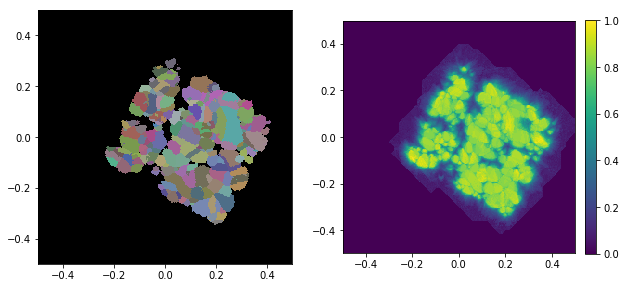

Loading configuration from SS316_s1_cycle_3_cooldown_nf_batch.yml
22
try to clean up gpu memory
maxQ: 9, minQ: 0, NG: 136
maxQ: 9, minQ: 0, NG: 136
exp data loaded, shape is: (21880697, 4)./heliu/work/suter_feb20/SS316_s1_cycle_3_cooldown_nf/reduction/SS316_s1_cycle_3_cooldown_nf/SS316_s1_cycle_3_cooldown_nf_binz22_000719.bin1
copy exp data to gpu memory ...
start create exp data in cpu ram ...
 reset searchBatchSize into 6000
start reconstruction ... 

Niter: 20, vIdx: 0028680, prog: 0000001/0024573, conf: 0.320000, pkcnt: 50, euler: [ 40.8334  15.9328 253.5668]4e+02]
 
number of flood fills: 1614
start post processing, moving grain boundaries untile stable ...
number of post process iteration: 14, number of voxel revisited: 41653
post process takes is 217.818 seconds
reconstruction finished 

SourceModule time:  1132.703 seconds.
saved as npy format: SS316_s1_cycle_3_cooldown_nf_q9_rot720_z22_250x250_0.004_shift_0.0_0.0_0.0.npy


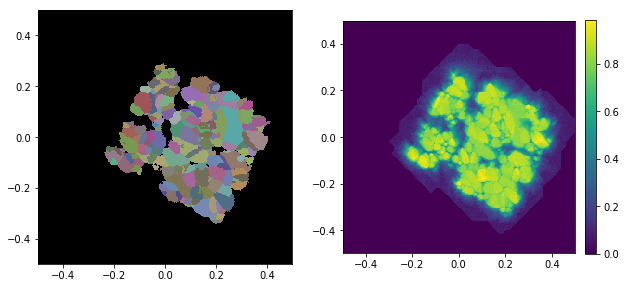

Loading configuration from SS316_s1_cycle_3_cooldown_nf_batch.yml
23
try to clean up gpu memory
maxQ: 9, minQ: 0, NG: 136
maxQ: 9, minQ: 0, NG: 136
exp data loaded, shape is: (21727633, 4)./heliu/work/suter_feb20/SS316_s1_cycle_3_cooldown_nf/reduction/SS316_s1_cycle_3_cooldown_nf/SS316_s1_cycle_3_cooldown_nf_binz23_000719.bin1
copy exp data to gpu memory ...
start create exp data in cpu ram ...
 reset searchBatchSize into 6000
start reconstruction ... 

Niter: 23, vIdx: 0037591, prog: 0000001/0024573, conf: 0.226415, pkcnt: 53, euler: [255.6152   7.8455 157.9494]3e+02]
 
number of flood fills: 1619
start post processing, moving grain boundaries untile stable ...
number of post process iteration: 13, number of voxel revisited: 42108
post process takes is 219.655 seconds
reconstruction finished 

SourceModule time:  1147.777 seconds.
saved as npy format: SS316_s1_cycle_3_cooldown_nf_q9_rot720_z23_250x250_0.004_shift_0.0_0.0_0.0.npy


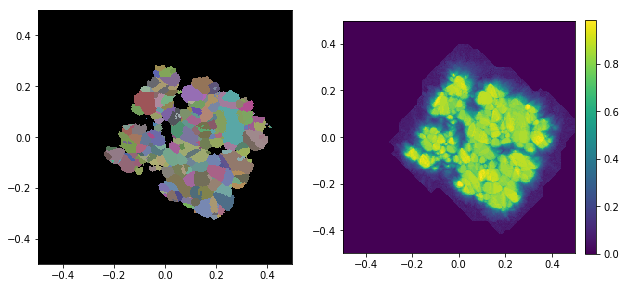

Loading configuration from SS316_s1_cycle_3_cooldown_nf_batch.yml
24
try to clean up gpu memory
maxQ: 9, minQ: 0, NG: 136
maxQ: 9, minQ: 0, NG: 136
exp data loaded, shape is: (21654636, 4)./heliu/work/suter_feb20/SS316_s1_cycle_3_cooldown_nf/reduction/SS316_s1_cycle_3_cooldown_nf/SS316_s1_cycle_3_cooldown_nf_binz24_000719.bin1
copy exp data to gpu memory ...
start create exp data in cpu ram ...
 reset searchBatchSize into 6000
start reconstruction ... 

Niter: 23, vIdx: 0057140, prog: 0000001/0024573, conf: 0.200000, pkcnt: 50, euler: [150.8065  22.5428 206.0213]0e+02]
 
number of flood fills: 1529
start post processing, moving grain boundaries untile stable ...
number of post process iteration: 13, number of voxel revisited: 42494
post process takes is 221.573 seconds
reconstruction finished 

SourceModule time:  1144.937 seconds.
saved as npy format: SS316_s1_cycle_3_cooldown_nf_q9_rot720_z24_250x250_0.004_shift_0.0_0.0_0.0.npy


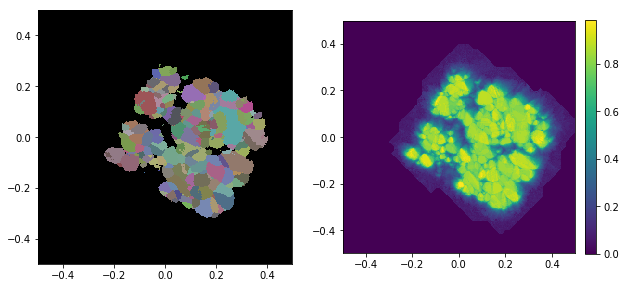

Loading configuration from SS316_s1_cycle_3_cooldown_nf_batch.yml
25
try to clean up gpu memory
maxQ: 9, minQ: 0, NG: 136
maxQ: 9, minQ: 0, NG: 136
exp data loaded, shape is: (21500973, 4)./heliu/work/suter_feb20/SS316_s1_cycle_3_cooldown_nf/reduction/SS316_s1_cycle_3_cooldown_nf/SS316_s1_cycle_3_cooldown_nf_binz25_000719.bin1
copy exp data to gpu memory ...
start create exp data in cpu ram ...
 reset searchBatchSize into 6000
start reconstruction ... 

Niter: 20, vIdx: 0030605, prog: 0000001/0024573, conf: 0.134615, pkcnt: 52, euler: [284.5492  13.7332 117.1854]8e+02]
 
number of flood fills: 1431
start post processing, moving grain boundaries untile stable ...
number of post process iteration: 14, number of voxel revisited: 43424
post process takes is 225.000 seconds
reconstruction finished 

SourceModule time:  1156.806 seconds.
saved as npy format: SS316_s1_cycle_3_cooldown_nf_q9_rot720_z25_250x250_0.004_shift_0.0_0.0_0.0.npy


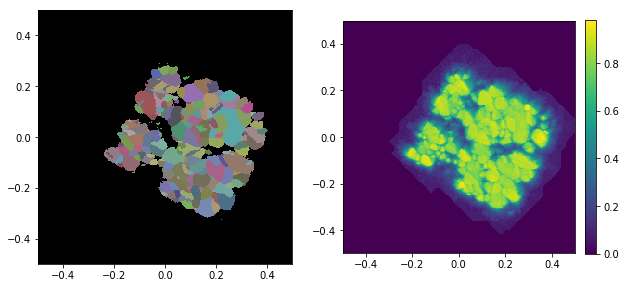

Loading configuration from SS316_s1_cycle_3_cooldown_nf_batch.yml
26
try to clean up gpu memory
maxQ: 9, minQ: 0, NG: 136
maxQ: 9, minQ: 0, NG: 136
exp data loaded, shape is: (21197019, 4)./heliu/work/suter_feb20/SS316_s1_cycle_3_cooldown_nf/reduction/SS316_s1_cycle_3_cooldown_nf/SS316_s1_cycle_3_cooldown_nf_binz26_000719.bin1
copy exp data to gpu memory ...
start create exp data in cpu ram ...
 reset searchBatchSize into 6000
start reconstruction ... 

Niter: 28, vIdx: 0048562, prog: 0000001/0024573, conf: 0.117647, pkcnt: 51, euler: [124.6117  64.5315 217.459 ]3e-02]
 
number of flood fills: 1206
start post processing, moving grain boundaries untile stable ...
number of post process iteration: 18, number of voxel revisited: 44870
post process takes is 234.088 seconds
reconstruction finished 

SourceModule time:  1165.097 seconds.
saved as npy format: SS316_s1_cycle_3_cooldown_nf_q9_rot720_z26_250x250_0.004_shift_0.0_0.0_0.0.npy


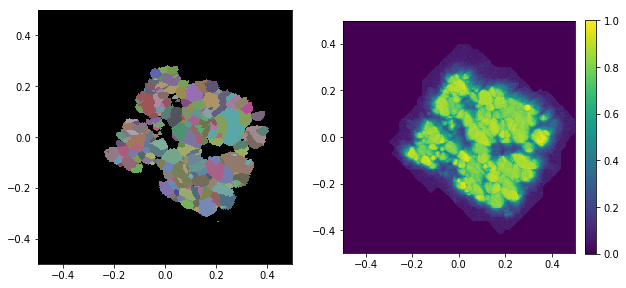

Loading configuration from SS316_s1_cycle_3_cooldown_nf_batch.yml
27
try to clean up gpu memory
maxQ: 9, minQ: 0, NG: 136
maxQ: 9, minQ: 0, NG: 136
exp data loaded, shape is: (21099838, 4)./heliu/work/suter_feb20/SS316_s1_cycle_3_cooldown_nf/reduction/SS316_s1_cycle_3_cooldown_nf/SS316_s1_cycle_3_cooldown_nf_binz27_000719.bin1
copy exp data to gpu memory ...
start create exp data in cpu ram ...
 reset searchBatchSize into 6000
start reconstruction ... 

Niter: 22, vIdx: 0045572, prog: 0000001/0024573, conf: 0.188679, pkcnt: 53, euler: [11.9622 45.0411 29.6002]32]7e-01]
 
number of flood fills: 1260
start post processing, moving grain boundaries untile stable ...
number of post process iteration: 15, number of voxel revisited: 45558
post process takes is 240.262 seconds
reconstruction finished 

SourceModule time:  1186.936 seconds.
saved as npy format: SS316_s1_cycle_3_cooldown_nf_q9_rot720_z27_250x250_0.004_shift_0.0_0.0_0.0.npy


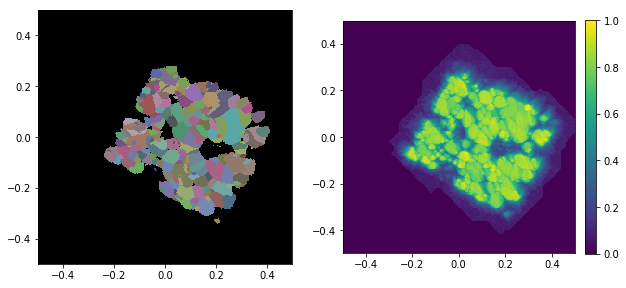

Loading configuration from SS316_s1_cycle_3_cooldown_nf_batch.yml
28
try to clean up gpu memory
maxQ: 9, minQ: 0, NG: 136
maxQ: 9, minQ: 0, NG: 136
exp data loaded, shape is: (21062683, 4)./heliu/work/suter_feb20/SS316_s1_cycle_3_cooldown_nf/reduction/SS316_s1_cycle_3_cooldown_nf/SS316_s1_cycle_3_cooldown_nf_binz28_000719.bin1
copy exp data to gpu memory ...
start create exp data in cpu ram ...
 reset searchBatchSize into 6000
start reconstruction ... 

Niter: 22, vIdx: 0057387, prog: 0000001/0024573, conf: 0.326531, pkcnt: 49, euler: [150.1556  14.893  197.4809]7e-02]
 
number of flood fills: 1362
start post processing, moving grain boundaries untile stable ...
number of post process iteration: 12, number of voxel revisited: 45038
post process takes is 246.910 seconds
reconstruction finished 

SourceModule time:  1209.788 seconds.
saved as npy format: SS316_s1_cycle_3_cooldown_nf_q9_rot720_z28_250x250_0.004_shift_0.0_0.0_0.0.npy


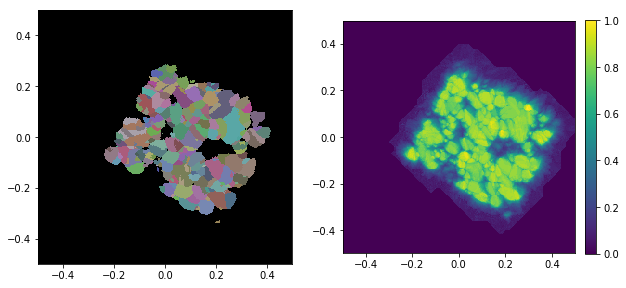

Loading configuration from SS316_s1_cycle_3_cooldown_nf_batch.yml
29
try to clean up gpu memory
maxQ: 9, minQ: 0, NG: 136
maxQ: 9, minQ: 0, NG: 136
exp data loaded, shape is: (20837229, 4)./heliu/work/suter_feb20/SS316_s1_cycle_3_cooldown_nf/reduction/SS316_s1_cycle_3_cooldown_nf/SS316_s1_cycle_3_cooldown_nf_binz29_000719.bin1
copy exp data to gpu memory ...
start create exp data in cpu ram ...
 reset searchBatchSize into 6000
start reconstruction ... 

 flood filling ...050104, prog: 0000001/0024573, conf: 0.812500, pkcnt: 48, euler: [138.3751  90.2494 319.0104]7e+02]
 
number of flood fills: 1252
start post processing, moving grain boundaries untile stable ...
number of post process iteration: 11, number of voxel revisited: 45391
post process takes is 240.386 seconds
reconstruction finished 

SourceModule time:  1216.300 seconds.
saved as npy format: SS316_s1_cycle_3_cooldown_nf_q9_rot720_z29_250x250_0.004_shift_0.0_0.0_0.0.npy


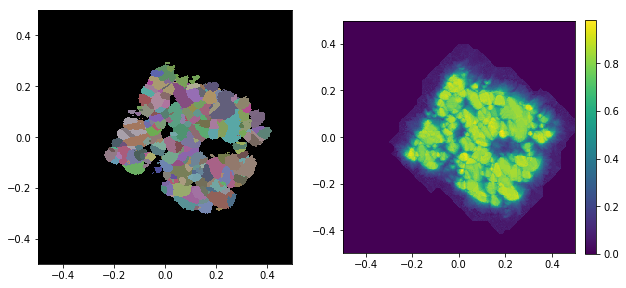

Loading configuration from SS316_s1_cycle_3_cooldown_nf_batch.yml
30
try to clean up gpu memory
maxQ: 9, minQ: 0, NG: 136
maxQ: 9, minQ: 0, NG: 136
exp data loaded, shape is: (20693206, 4)./heliu/work/suter_feb20/SS316_s1_cycle_3_cooldown_nf/reduction/SS316_s1_cycle_3_cooldown_nf/SS316_s1_cycle_3_cooldown_nf_binz30_000719.bin1
copy exp data to gpu memory ...
start create exp data in cpu ram ...
 reset searchBatchSize into 6000
start reconstruction ... 

Niter: 26, vIdx: 0051617, prog: 0000001/0024573, conf: 0.224490, pkcnt: 49, euler: [313.1736  23.6279  78.2617]1e+02]
 
number of flood fills: 1172
start post processing, moving grain boundaries untile stable ...
number of post process iteration: 17, number of voxel revisited: 47229
post process takes is 251.934 seconds
reconstruction finished 

SourceModule time:  1229.392 seconds.
saved as npy format: SS316_s1_cycle_3_cooldown_nf_q9_rot720_z30_250x250_0.004_shift_0.0_0.0_0.0.npy


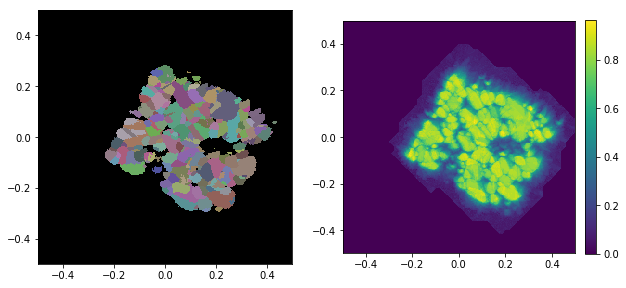

Loading configuration from SS316_s1_cycle_3_cooldown_nf_batch.yml
31
try to clean up gpu memory
maxQ: 9, minQ: 0, NG: 136
maxQ: 9, minQ: 0, NG: 136
exp data loaded, shape is: (20566293, 4)./heliu/work/suter_feb20/SS316_s1_cycle_3_cooldown_nf/reduction/SS316_s1_cycle_3_cooldown_nf/SS316_s1_cycle_3_cooldown_nf_binz31_000719.bin1
copy exp data to gpu memory ...
start create exp data in cpu ram ...
 reset searchBatchSize into 6000
start reconstruction ... 

Niter: 23, vIdx: 0030640, prog: 0000001/0024573, conf: 0.361702, pkcnt: 47, euler: [328.7571  64.9951  58.1574]6e+02]
 
number of flood fills: 1069
start post processing, moving grain boundaries untile stable ...
number of post process iteration: 14, number of voxel revisited: 46587
post process takes is 247.947 seconds
reconstruction finished 

SourceModule time:  1214.888 seconds.
saved as npy format: SS316_s1_cycle_3_cooldown_nf_q9_rot720_z31_250x250_0.004_shift_0.0_0.0_0.0.npy


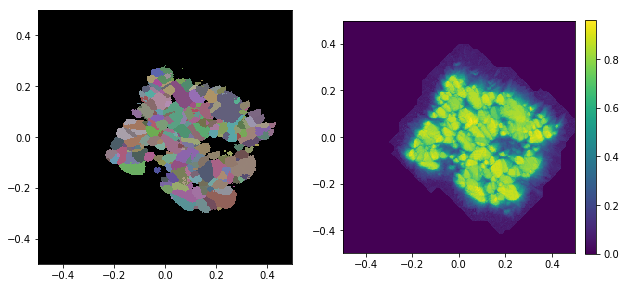

Loading configuration from SS316_s1_cycle_3_cooldown_nf_batch.yml
32
try to clean up gpu memory
maxQ: 9, minQ: 0, NG: 136
maxQ: 9, minQ: 0, NG: 136
exp data loaded, shape is: (20418294, 4)./heliu/work/suter_feb20/SS316_s1_cycle_3_cooldown_nf/reduction/SS316_s1_cycle_3_cooldown_nf/SS316_s1_cycle_3_cooldown_nf_binz32_000719.bin1
copy exp data to gpu memory ...
start create exp data in cpu ram ...
 reset searchBatchSize into 6000
start reconstruction ... 

Niter: 22, vIdx: 0031724, prog: 0000001/0024573, conf: 0.078431, pkcnt: 51, euler: [266.8228  72.4911 134.5285]2e+02]
 
number of flood fills: 1131
start post processing, moving grain boundaries untile stable ...
number of post process iteration: 14, number of voxel revisited: 46534
post process takes is 247.363 seconds
reconstruction finished 

SourceModule time:  1221.605 seconds.
saved as npy format: SS316_s1_cycle_3_cooldown_nf_q9_rot720_z32_250x250_0.004_shift_0.0_0.0_0.0.npy


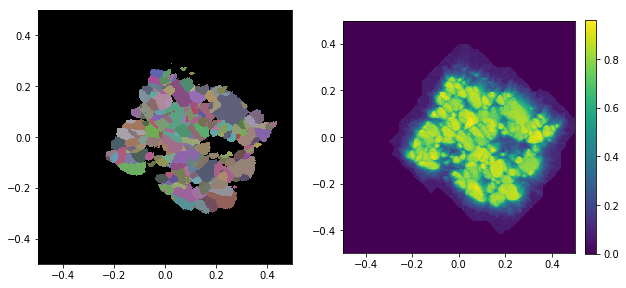

Loading configuration from SS316_s1_cycle_3_cooldown_nf_batch.yml
33
try to clean up gpu memory
maxQ: 9, minQ: 0, NG: 136
maxQ: 9, minQ: 0, NG: 136
exp data loaded, shape is: (20338193, 4)./heliu/work/suter_feb20/SS316_s1_cycle_3_cooldown_nf/reduction/SS316_s1_cycle_3_cooldown_nf/SS316_s1_cycle_3_cooldown_nf_binz33_000719.bin1
copy exp data to gpu memory ...
start create exp data in cpu ram ...
 reset searchBatchSize into 6000
start reconstruction ... 

Niter: 31, vIdx: 0050169, prog: 0000001/0024573, conf: 0.086957, pkcnt: 46, euler: [140.8013  63.6111 314.3739]6e+01]
 
number of flood fills: 1212
start post processing, moving grain boundaries untile stable ...
number of post process iteration: 13, number of voxel revisited: 46490
post process takes is 246.926 seconds
reconstruction finished 

SourceModule time:  1212.244 seconds.
saved as npy format: SS316_s1_cycle_3_cooldown_nf_q9_rot720_z33_250x250_0.004_shift_0.0_0.0_0.0.npy


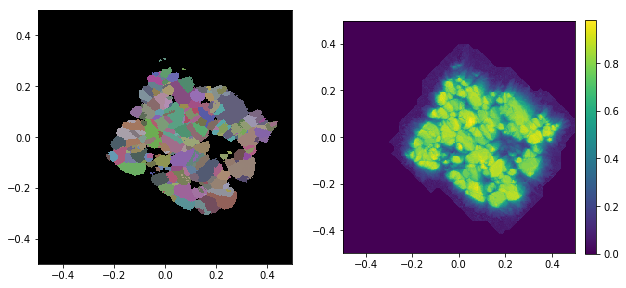

Loading configuration from SS316_s1_cycle_3_cooldown_nf_batch.yml
34
try to clean up gpu memory
maxQ: 9, minQ: 0, NG: 136
maxQ: 9, minQ: 0, NG: 136
exp data loaded, shape is: (20619809, 4)./heliu/work/suter_feb20/SS316_s1_cycle_3_cooldown_nf/reduction/SS316_s1_cycle_3_cooldown_nf/SS316_s1_cycle_3_cooldown_nf_binz34_000719.bin1
copy exp data to gpu memory ...
start create exp data in cpu ram ...
 reset searchBatchSize into 6000
start reconstruction ... 

Niter: 25, vIdx: 0040081, prog: 0000001/0024573, conf: 0.744681, pkcnt: 47, euler: [ 90.0718  57.7406 230.953 ]6e-02]
 
number of flood fills: 1205
start post processing, moving grain boundaries untile stable ...
number of post process iteration: 17, number of voxel revisited: 46281
post process takes is 248.452 seconds
reconstruction finished 

SourceModule time:  1198.089 seconds.
saved as npy format: SS316_s1_cycle_3_cooldown_nf_q9_rot720_z34_250x250_0.004_shift_0.0_0.0_0.0.npy


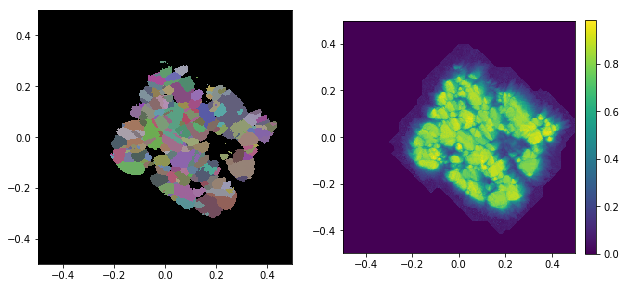

Loading configuration from SS316_s1_cycle_3_cooldown_nf_batch.yml
35
try to clean up gpu memory
maxQ: 9, minQ: 0, NG: 136
maxQ: 9, minQ: 0, NG: 136
exp data loaded, shape is: (20838526, 4)./heliu/work/suter_feb20/SS316_s1_cycle_3_cooldown_nf/reduction/SS316_s1_cycle_3_cooldown_nf/SS316_s1_cycle_3_cooldown_nf_binz35_000719.bin1
copy exp data to gpu memory ...
start create exp data in cpu ram ...
 reset searchBatchSize into 6000
start reconstruction ... 

 flood filling ...049859, prog: 0000001/0024573, conf: 0.812500, pkcnt: 48, euler: [228.604  130.9972 270.3704]9e+02]
 
number of flood fills: 1119
start post processing, moving grain boundaries untile stable ...
number of post process iteration: 11, number of voxel revisited: 47118
post process takes is 251.857 seconds
reconstruction finished 

SourceModule time:  1188.884 seconds.
saved as npy format: SS316_s1_cycle_3_cooldown_nf_q9_rot720_z35_250x250_0.004_shift_0.0_0.0_0.0.npy


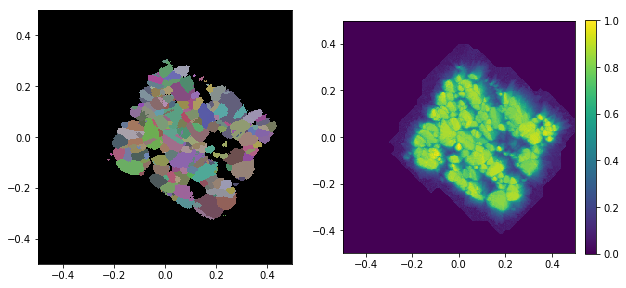

In [22]:
for layer in range(36):
    c = config.Config().load(f'{identifier}_batch.yml') # read configuration file, create a configuration class:d
    c.fileBinLayerIdx = layer
    #print(c)
    print(layer)
    S.load_config(c,reloadData=True)
    S.serial_recon_multi_stage()
    MicFileTool.plot_mic_and_conf(S.squareMicData, 0.4)

In [1]:
# after reconstruction of the whole stack.
# save cropped into tiffstack and ang stack
from hexomap import recon_format
lNpyFile = []
folder = './'
initial = 'SS316_s1_cycle_3_cooldown_nf'
for layer in range(0,36):
    lNpyFile.append(f'{folder}{initial}_q9_rot720_z{layer}_250x250_0.004_shift_0.0_0.0_0.0.npy')
tiff_stack_initial = f'{folder}{initial}_tiff_stack/{initial}'
ang_stack_initial = f'{folder}{initial}_ang_stack/{initial}'
recon_format.npy_2_tiffstack(lNpyFile, tiff_stack_initial, minHitRatio=0.001,startIdx=1)
recon_format.npy_2_ang(lNpyFile,
                       ang_stack_initial,
                       sample='stanless_steel',
                       startIdx=1)

creating directory: ./SS316_s1_cycle_3_cooldown_nf_tiff_stack
processing layer 0: ./SS316_s1_cycle_3_cooldown_nf_q9_rot720_z0_250x250_0.004_shift_0.0_0.0_0.0.npy
./SS316_s1_cycle_3_cooldown_nf_tiff_stack/SS316_s1_cycle_3_cooldown_nf_1.TIFF
processing layer 1: ./SS316_s1_cycle_3_cooldown_nf_q9_rot720_z1_250x250_0.004_shift_0.0_0.0_0.0.npy
./SS316_s1_cycle_3_cooldown_nf_tiff_stack/SS316_s1_cycle_3_cooldown_nf_2.TIFF
processing layer 2: ./SS316_s1_cycle_3_cooldown_nf_q9_rot720_z2_250x250_0.004_shift_0.0_0.0_0.0.npy
./SS316_s1_cycle_3_cooldown_nf_tiff_stack/SS316_s1_cycle_3_cooldown_nf_3.TIFF
processing layer 3: ./SS316_s1_cycle_3_cooldown_nf_q9_rot720_z3_250x250_0.004_shift_0.0_0.0_0.0.npy
./SS316_s1_cycle_3_cooldown_nf_tiff_stack/SS316_s1_cycle_3_cooldown_nf_4.TIFF
processing layer 4: ./SS316_s1_cycle_3_cooldown_nf_q9_rot720_z4_250x250_0.004_shift_0.0_0.0_0.0.npy
./SS316_s1_cycle_3_cooldown_nf_tiff_stack/SS316_s1_cycle_3_cooldown_nf_5.TIFF
processing layer 5: ./SS316_s1_cycle_3_cooldown_

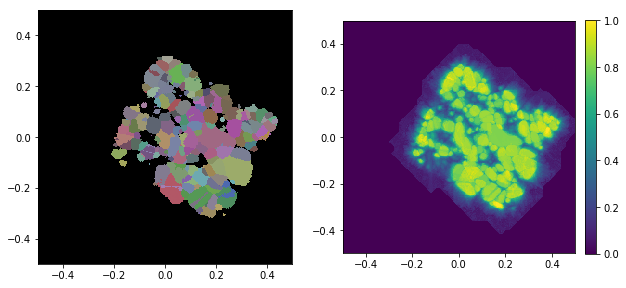

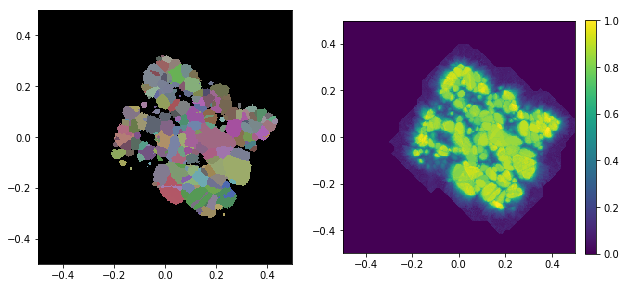

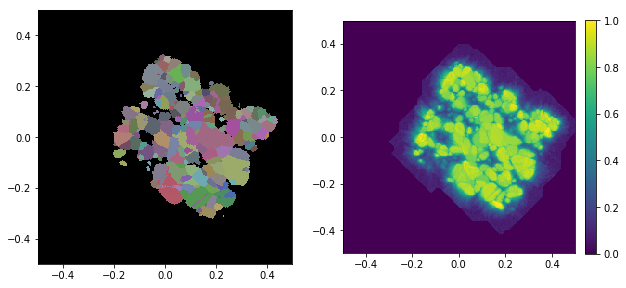

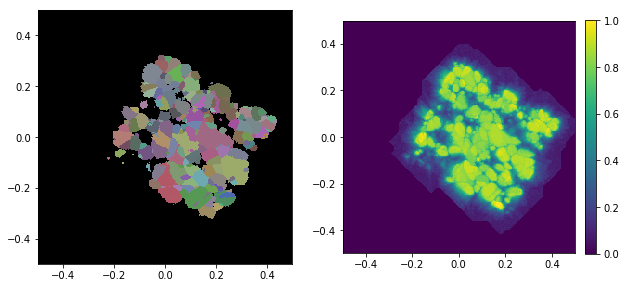

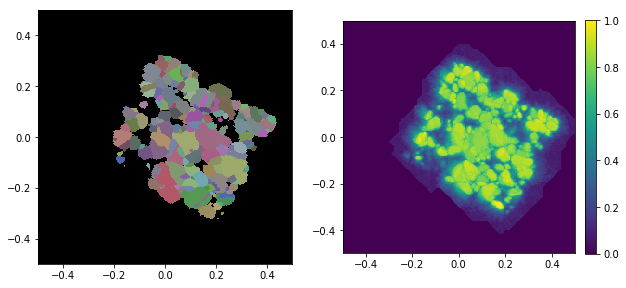

...

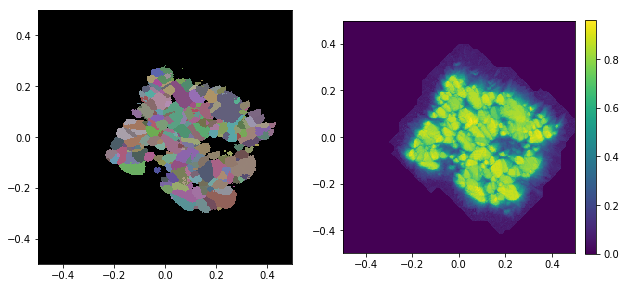

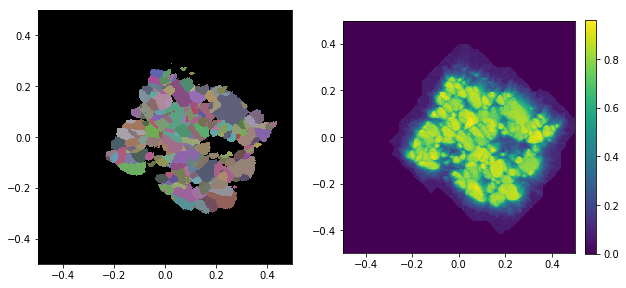

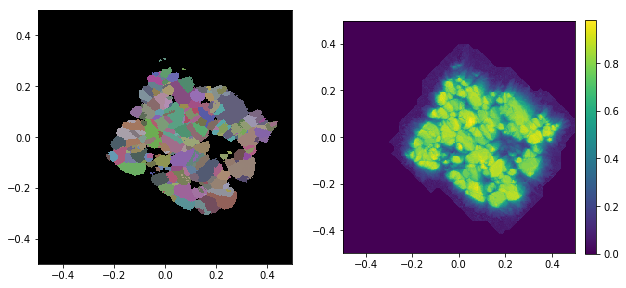

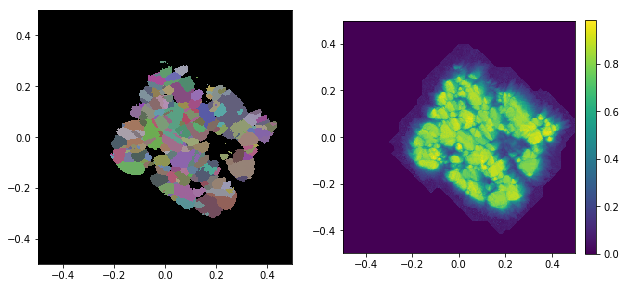

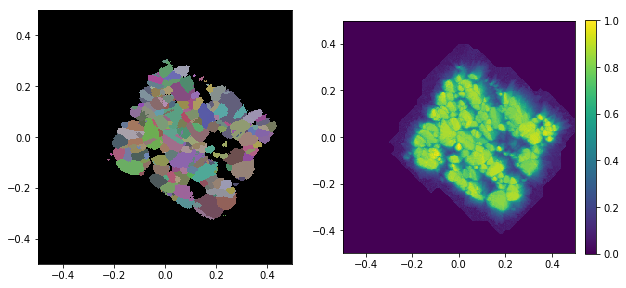

In [3]:
from hexomap import recon_format
import numpy as np
from hexomap import MicFileTool
lNpyFile = []
folder = './'
initial = 'SS316_s1_cycle_3_cooldown_nf'
for layer in range(0,36):
    mic = np.load(f'{folder}{initial}_q9_rot720_z{layer}_250x250_0.004_shift_0.0_0.0_0.0.npy')
    MicFileTool.plot_mic_and_conf(mic, 0.4)

# register tomo with nf result:

In [4]:
# translate tomo image into mask.
def get_tomo_y2idx(y, tomoCenterY, beamCenterPixel, tomoStartPixel,pixelSize=0.00148):
    '''
    y: 
        target y position
    tomoCenterY: 
        center y position of tomo scan, in mm, e.g. 15.599
    beamCenterPixel: 
        beam center position, e.g. 1202
    tomoStartPixel: 
        pixel number of the first layer of reconstruction, e.g. 910
    pixelSize: 
        pixel size in mm.
    return:
        file index of that y position.
    '''
    yDiff = y - tomoCenterY                  # dy
    #print(yDiff)
    pixelDiff = yDiff/pixelSize              #d_pixel
    pixelPos = pixelDiff + beamCenterPixel
    #print(pixelPos)
    idx = pixelPos - tomoStartPixel
    return int(np.floor(idx))

def get_nf_y_pos(layer, yStart, dY):
    '''
    get y position of near field layer
    layer: idx of layer
    yStart: y of first layer
    dY: y step between layers
    '''
    return layer*dY + yStart

def get_tomo_idx_by_layer(layer, yStart, dY, tomoCenterY, beamCenterPixel, tomoStartPixel,pixelSize=0.00148):
    '''
    get y position of near field layer
    layer: idx of layer
    yStart: y of first layer
    dY: y step between layers
    tomoCenterY: 
        center y position of tomo scan, in mm, e.g. 15.599
    beamCenterPixel: 
        beam center position, e.g. 1202
    tomoStartPixel: 
        pixel number of the first layer of reconstruction, e.g. 910
    pixelSize: 
        pixel size in mm.
    return:
        idx:
            file index of tomo recon images
    '''
    y = get_nf_y_pos(layer, yStart, dY)
    idx = get_tomo_y2idx(y=y,tomoCenterY=tomoCenterY, beamCenterPixel=beamCenterPixel, tomoStartPixel=tomoStartPixel,pixelSize=pixelSize)
    return idx

def tomo_2_mask(img,threhold, maskShape=[500,500], maskVoxelSize=0.002,maskShift=[0,0,0],rotCenter=1024,pixelSize=0.00148):
    '''
    img: 
        tomo reconstruction image
    threhold:
        above this threshold taken as sample.
    maskShape:
        shape of mask
    maskVoxelSize:
        in mm
    maskShift:
        in mm
    pixelSize:
        in mm, recon voxel size.
    return:
        raw, mask
    '''
#     center = 2047 - center
#     print(f'tranform tomo center to HEDM center: {center}')
    #rot_center = 1011.7
    shape = maskShape
    shift = np.array(maskShift).ravel()
    raw = np.zeros([shape[0],shape[1]]) # in pixel, delta pixel from center
    midVoxel = np.array([float(shape[0]) / 2, float(shape[1]) / 2, 0])
    for ii in range(shape[0]):
        for jj in range(shape[1]):
            idxTmp =  (((np.array([ii + 0.5, jj + 0.5, 0]) - midVoxel) * maskVoxelSize + shift)/pixelSize + np.array([rotCenter,rotCenter, 0])).astype(np.int32)
            raw[ii,jj] = img[idxTmp[0],idxTmp[1]]
    mask = raw>threhold
    return raw, mask




showing layer: 0
index is : 505


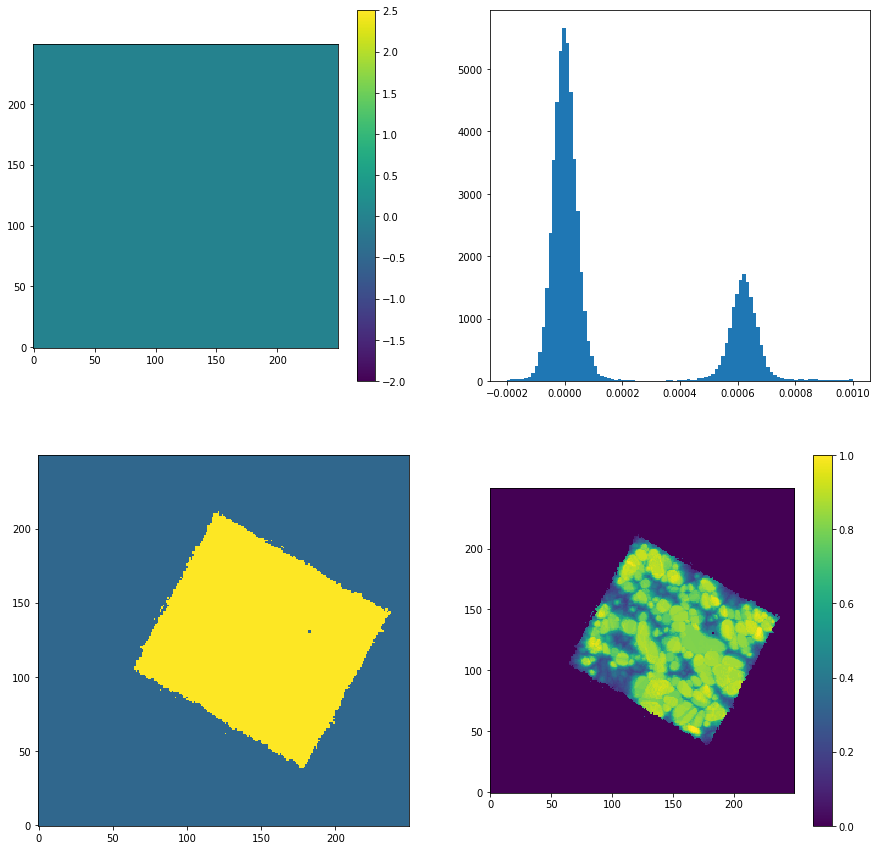

showing layer: 1
index is : 508


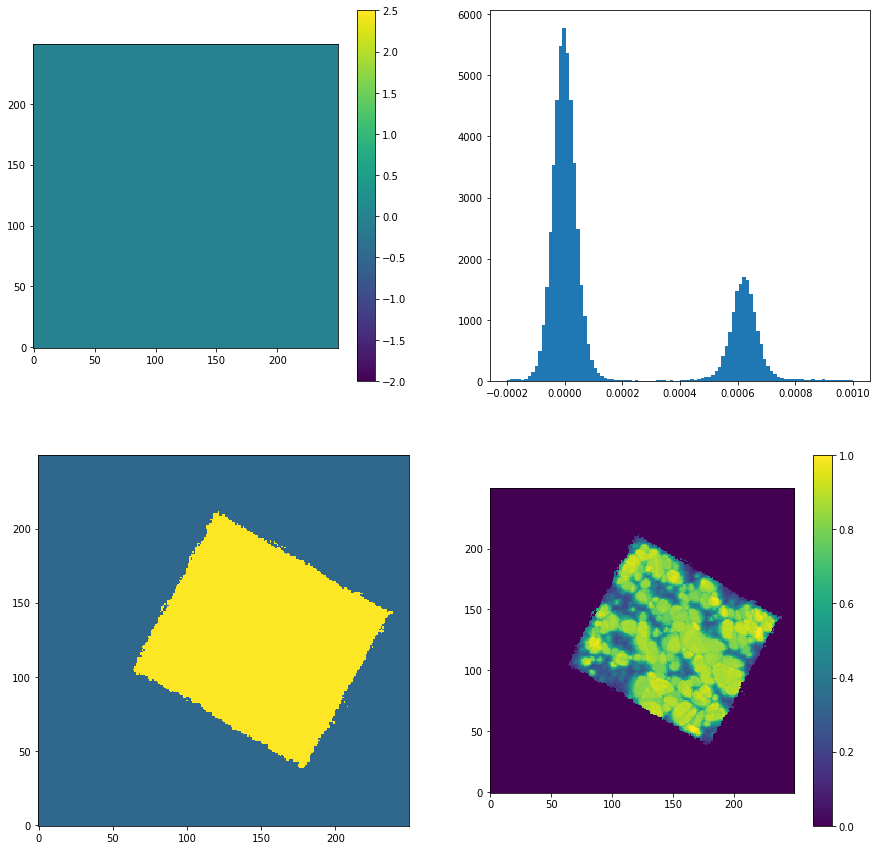

showing layer: 2
index is : 512


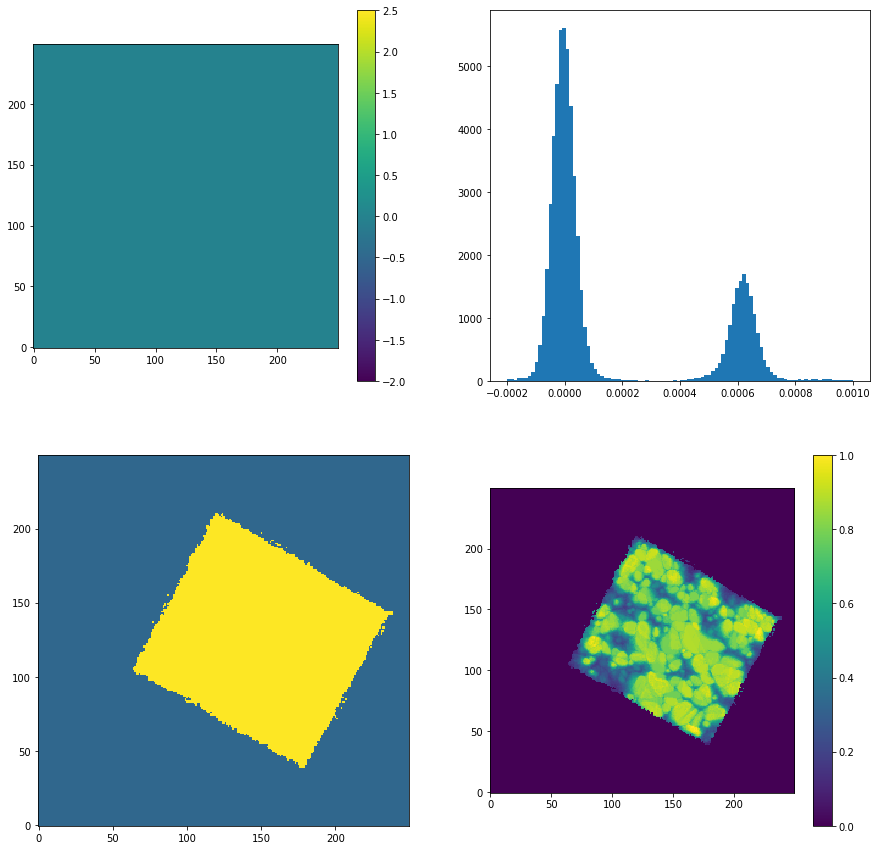

showing layer: 3
index is : 515


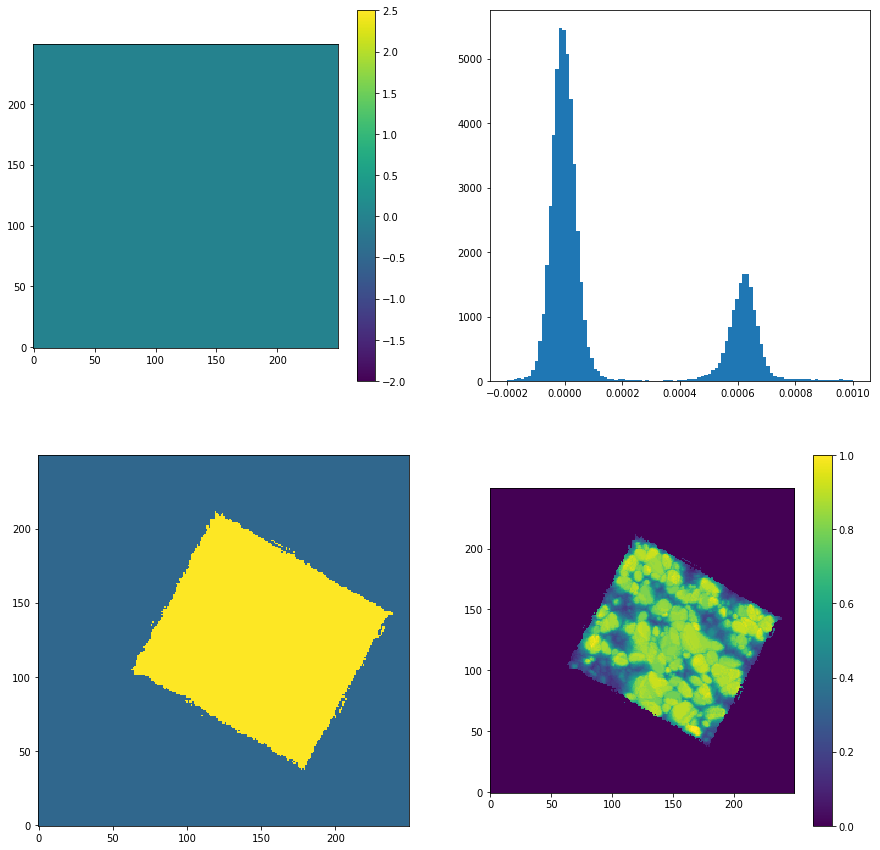

showing layer: 4
index is : 518


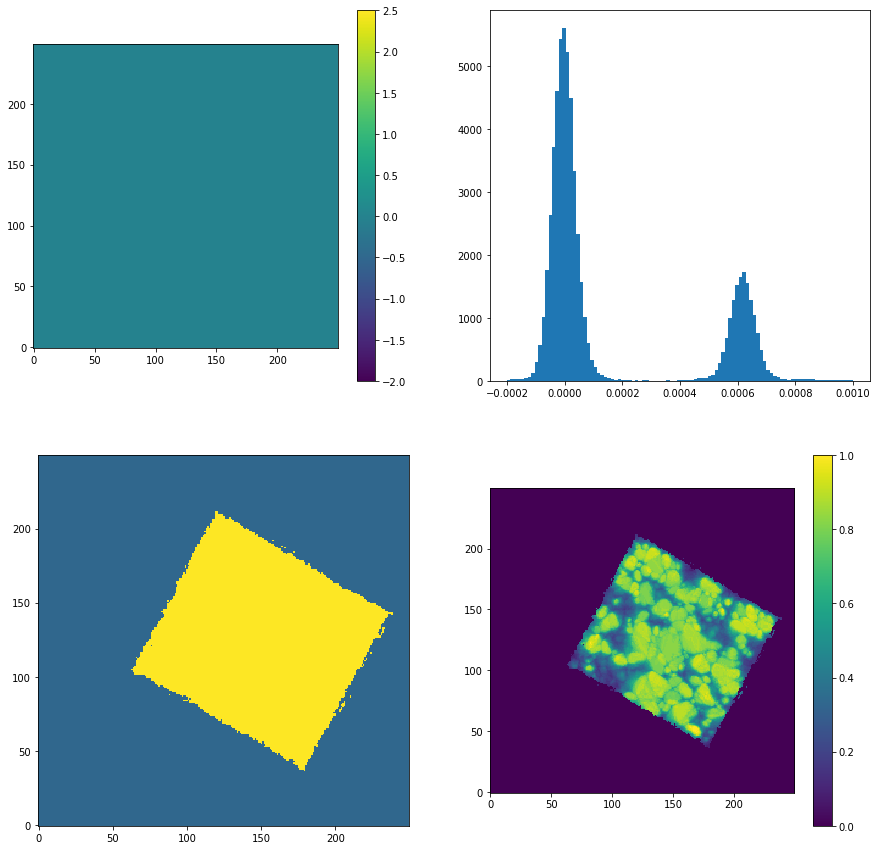

showing layer: 5
index is : 522


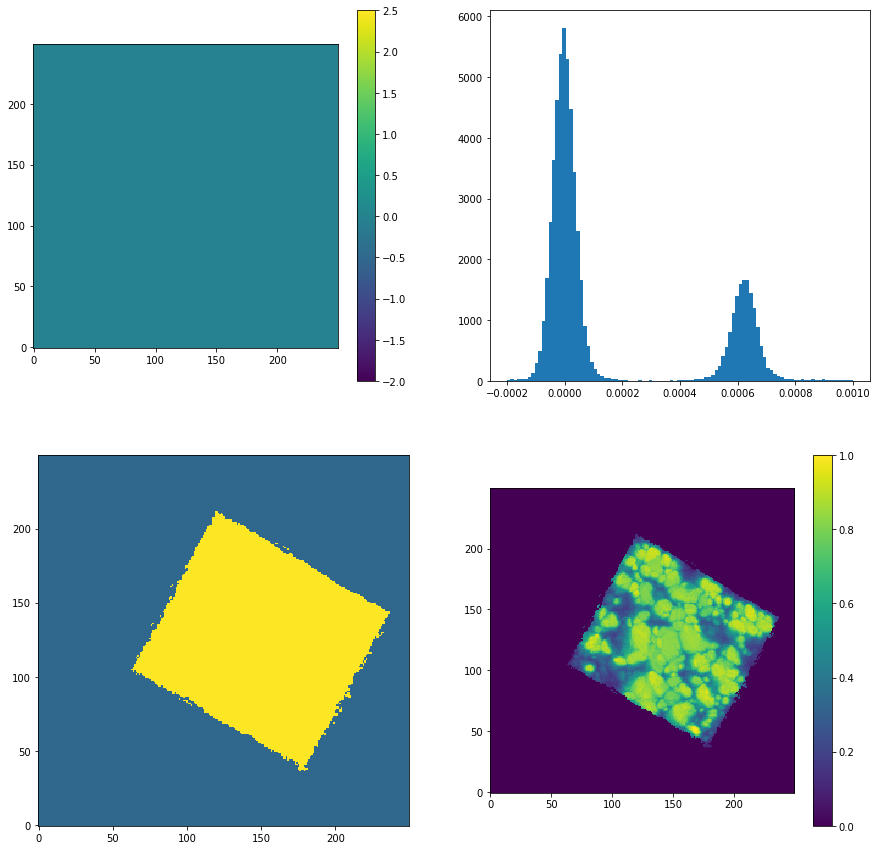

showing layer: 6
index is : 525


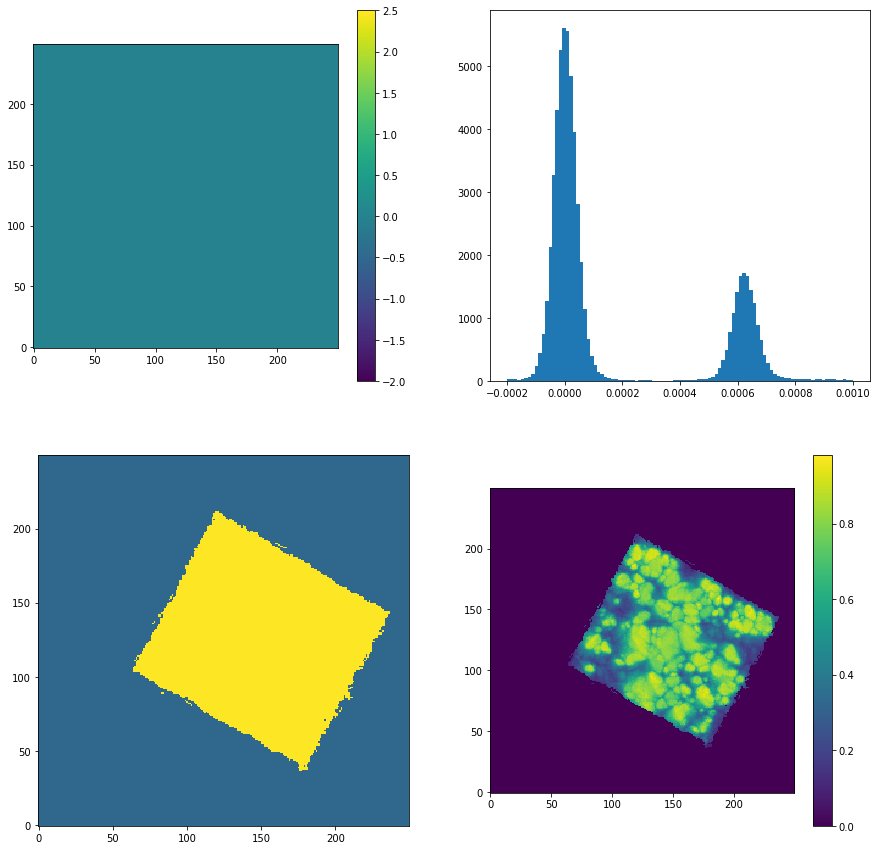

showing layer: 7
index is : 529


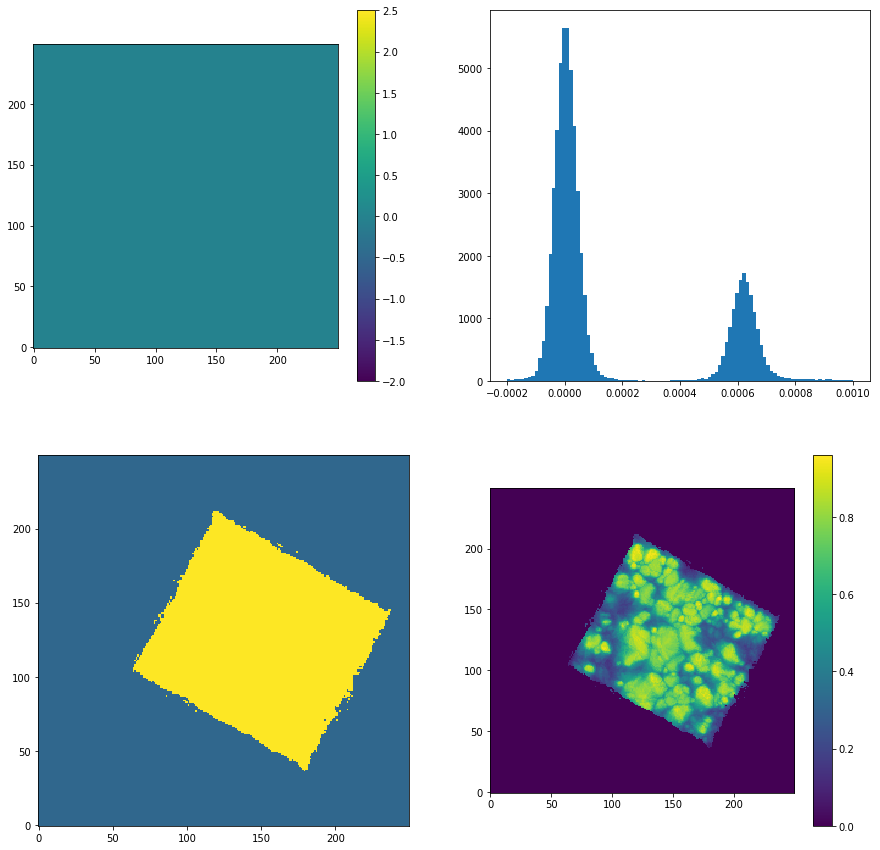

showing layer: 8
index is : 532


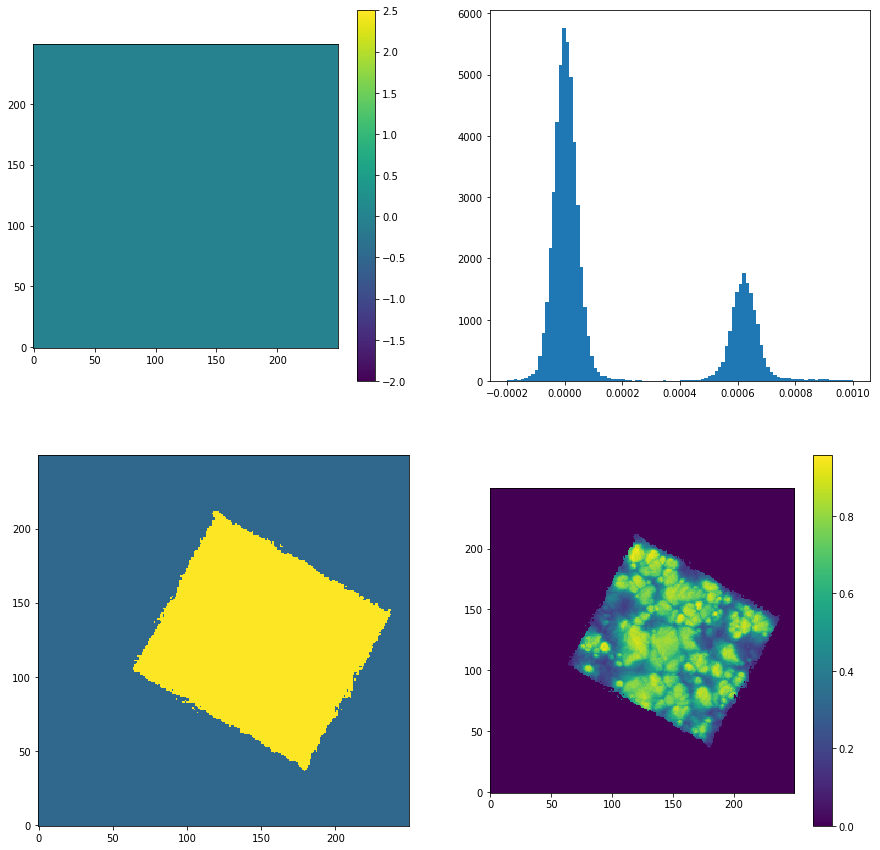

showing layer: 9
index is : 535


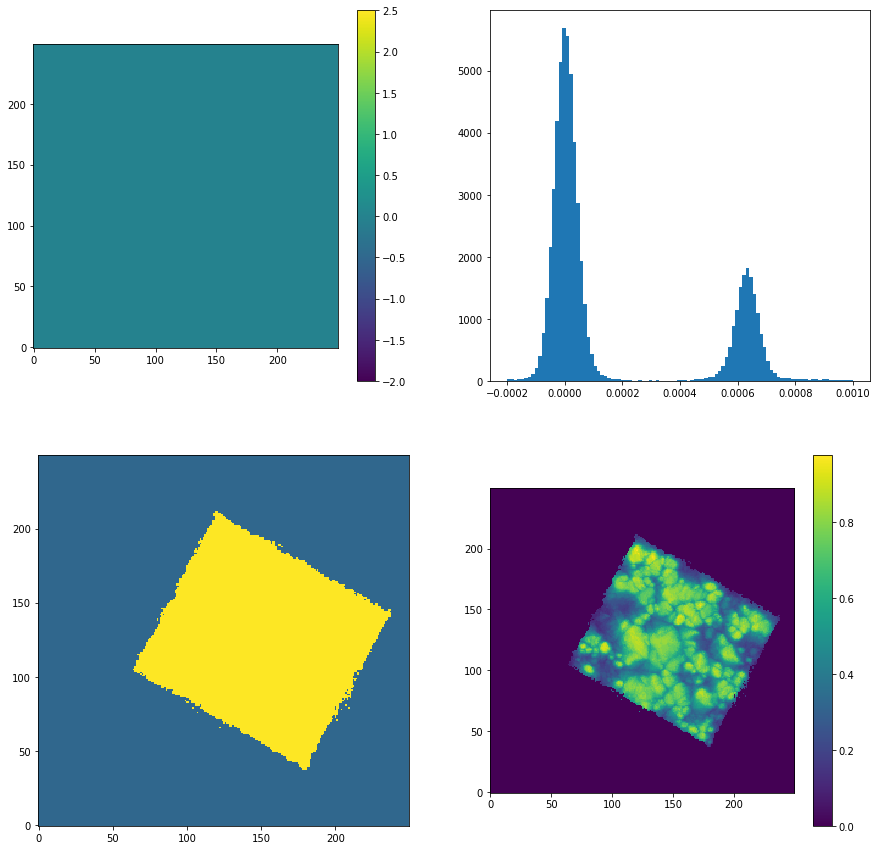

showing layer: 10
index is : 539


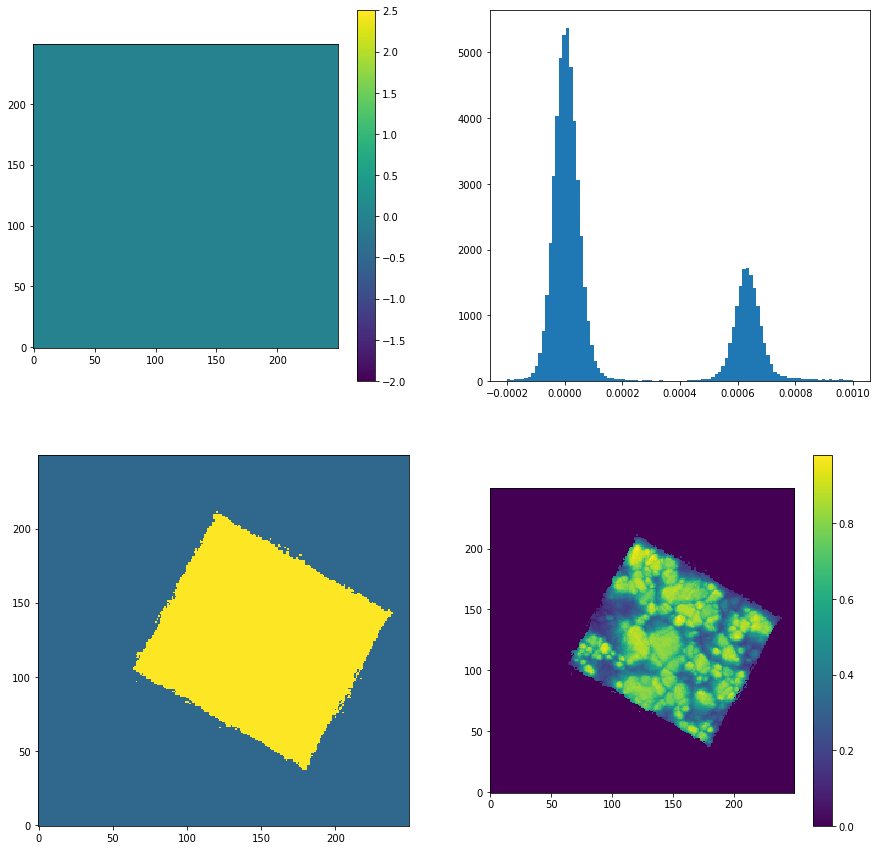

showing layer: 11
index is : 542


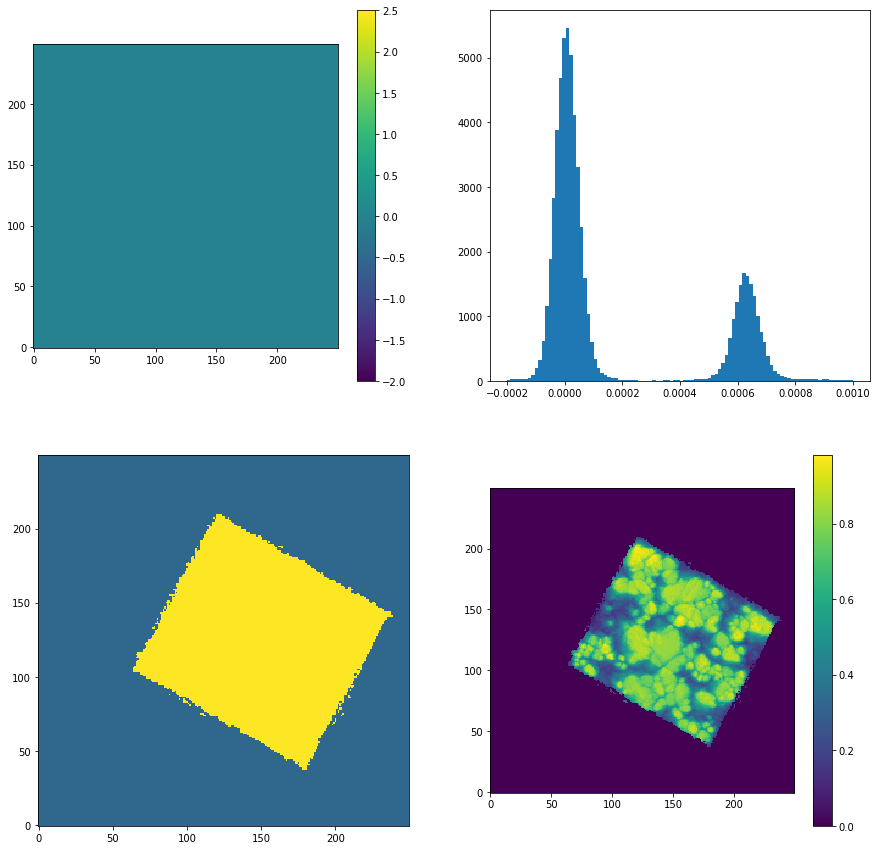

showing layer: 12
index is : 546


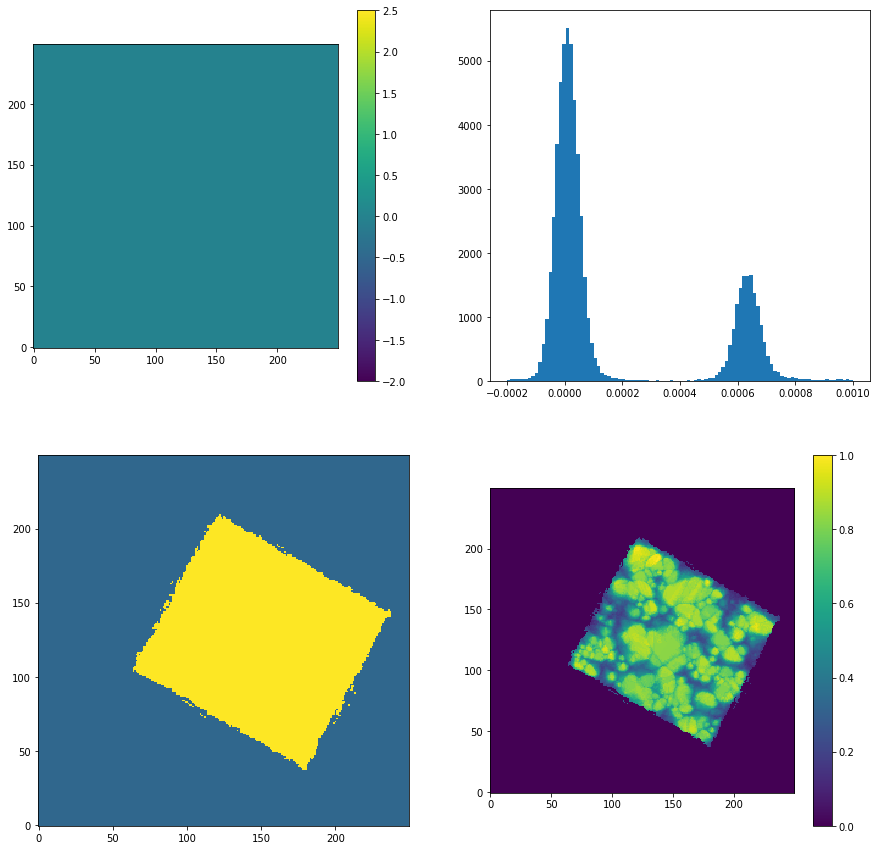

showing layer: 13
index is : 549


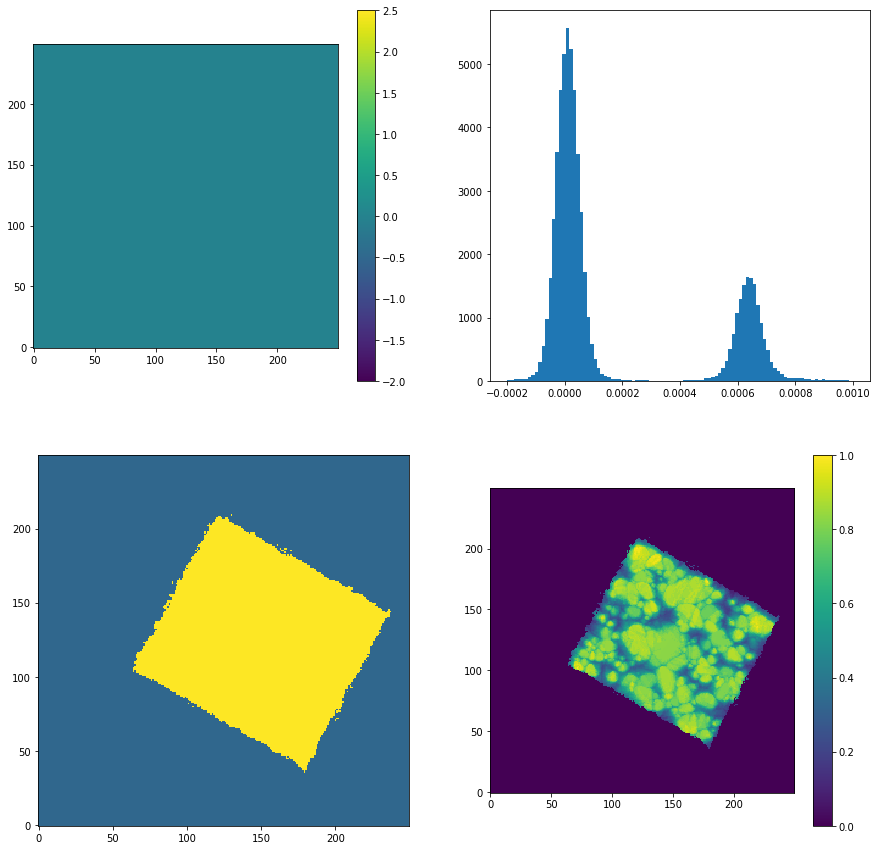

showing layer: 14
index is : 553


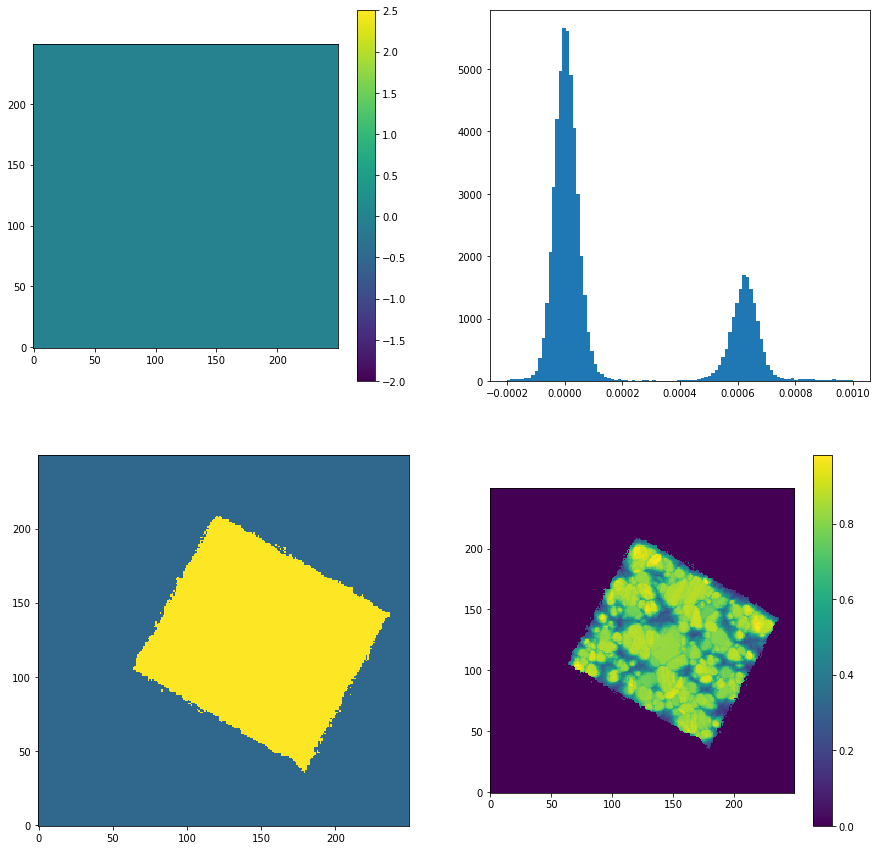

showing layer: 15
index is : 556


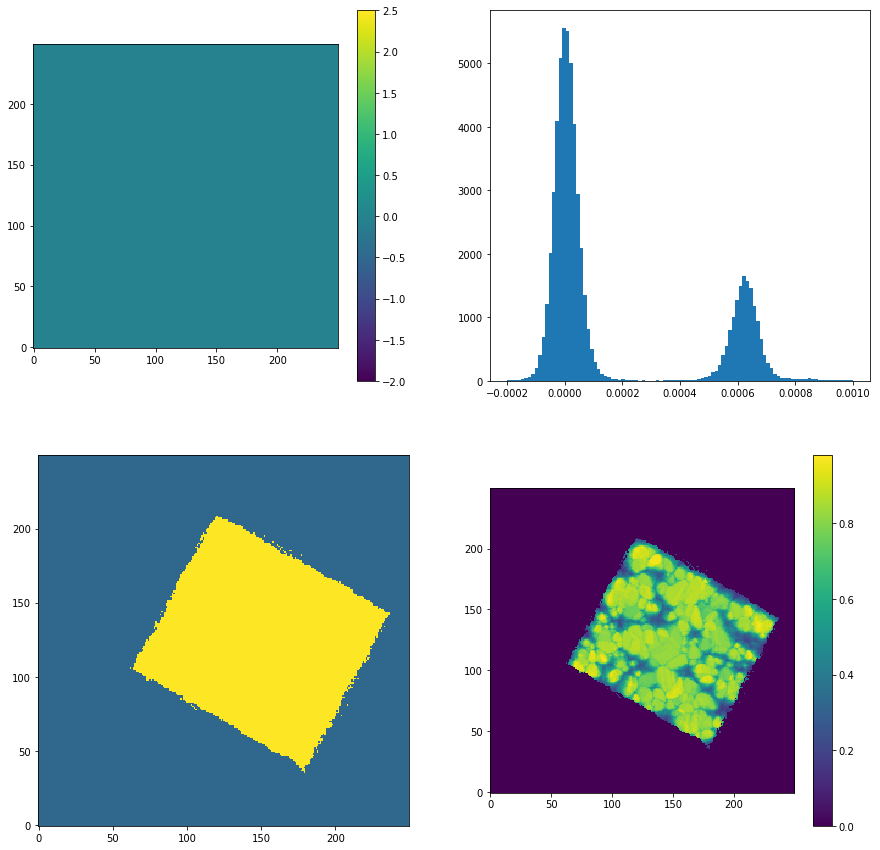

showing layer: 16
index is : 559


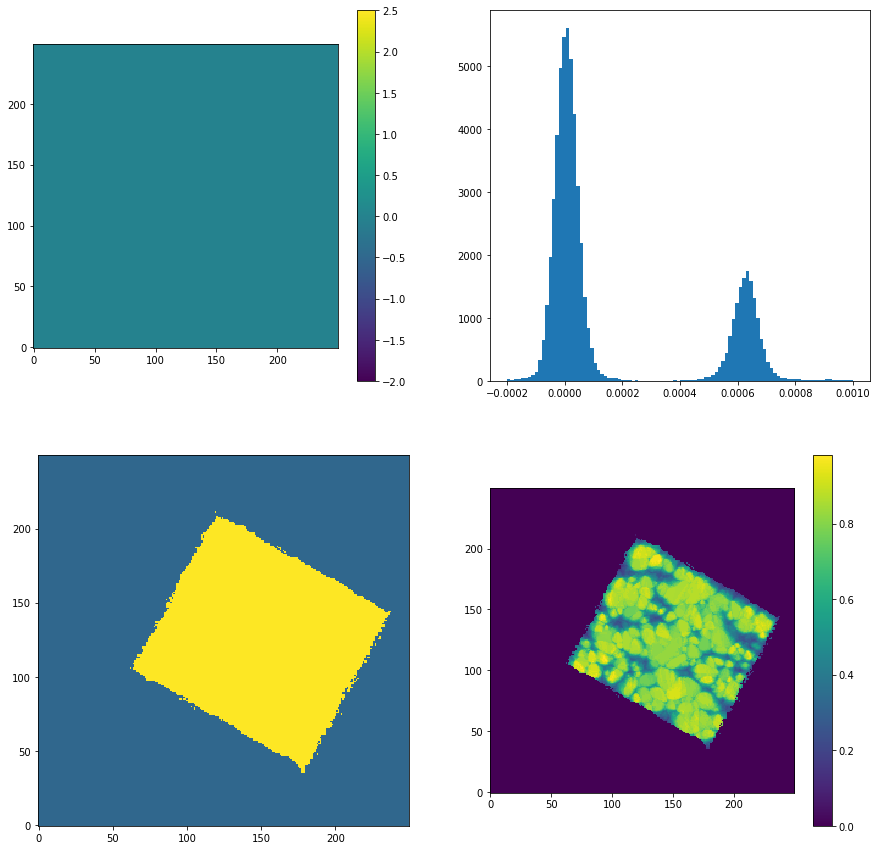

showing layer: 17
index is : 563


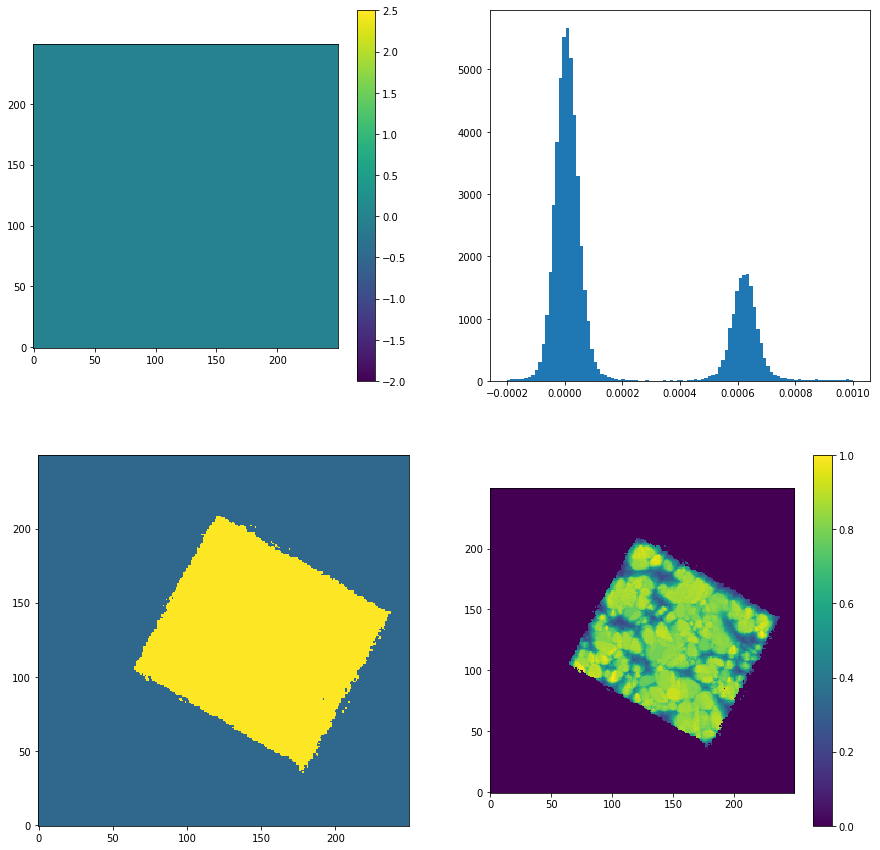

showing layer: 18
index is : 566


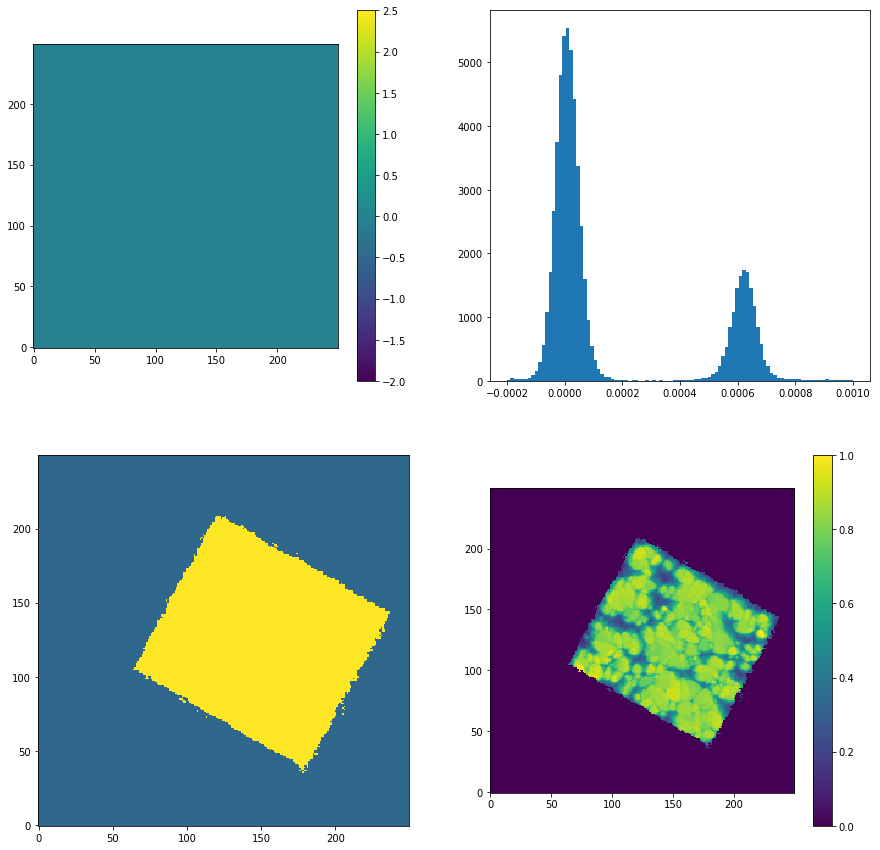

showing layer: 19
index is : 570


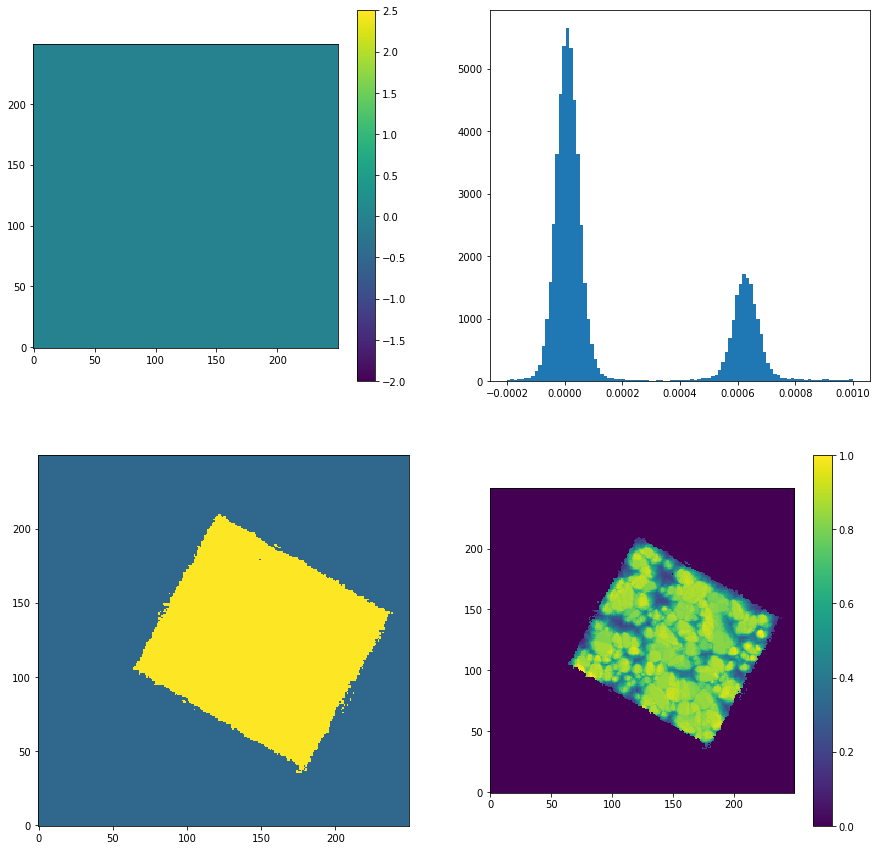

showing layer: 20
index is : 573


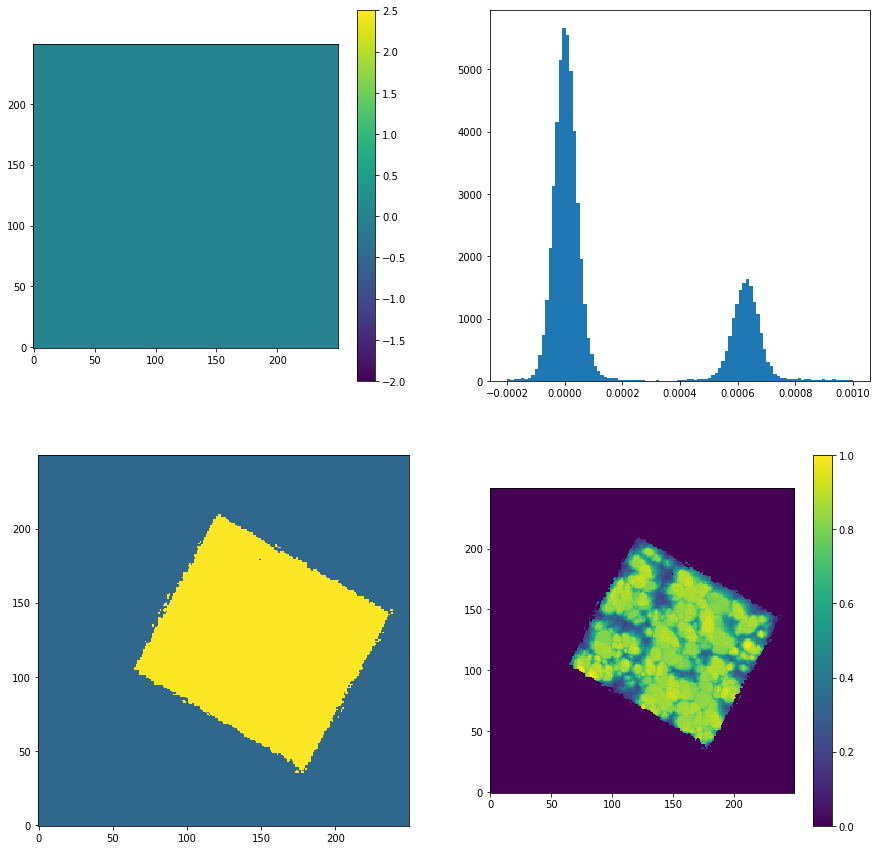

showing layer: 21
index is : 576


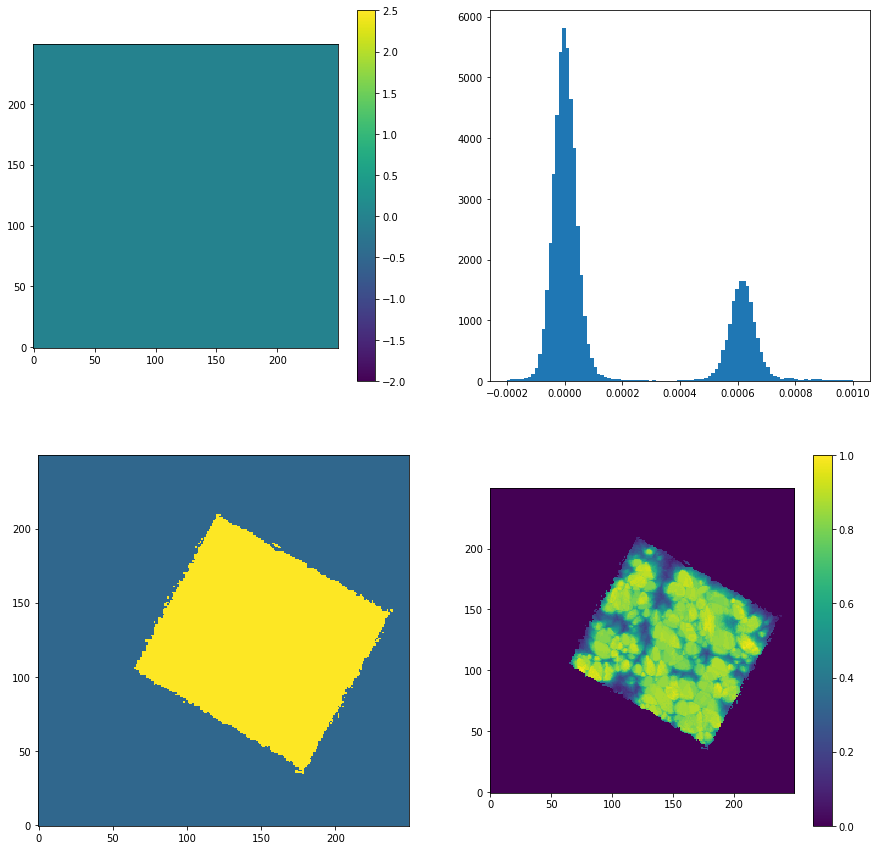

showing layer: 22
index is : 580


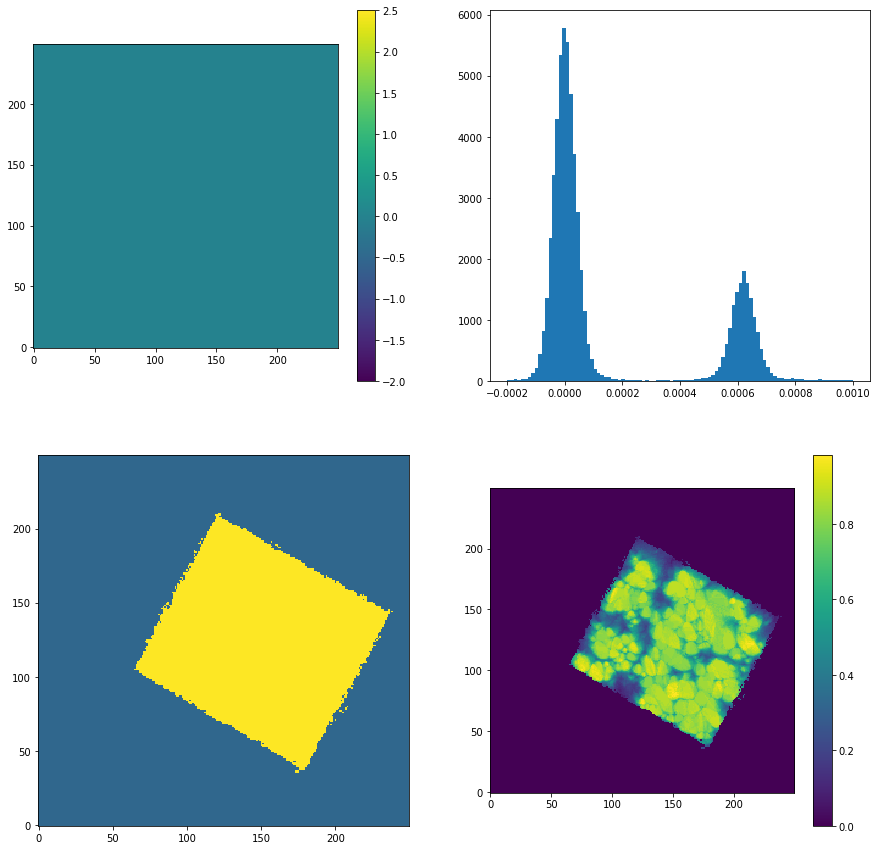

showing layer: 23
index is : 583


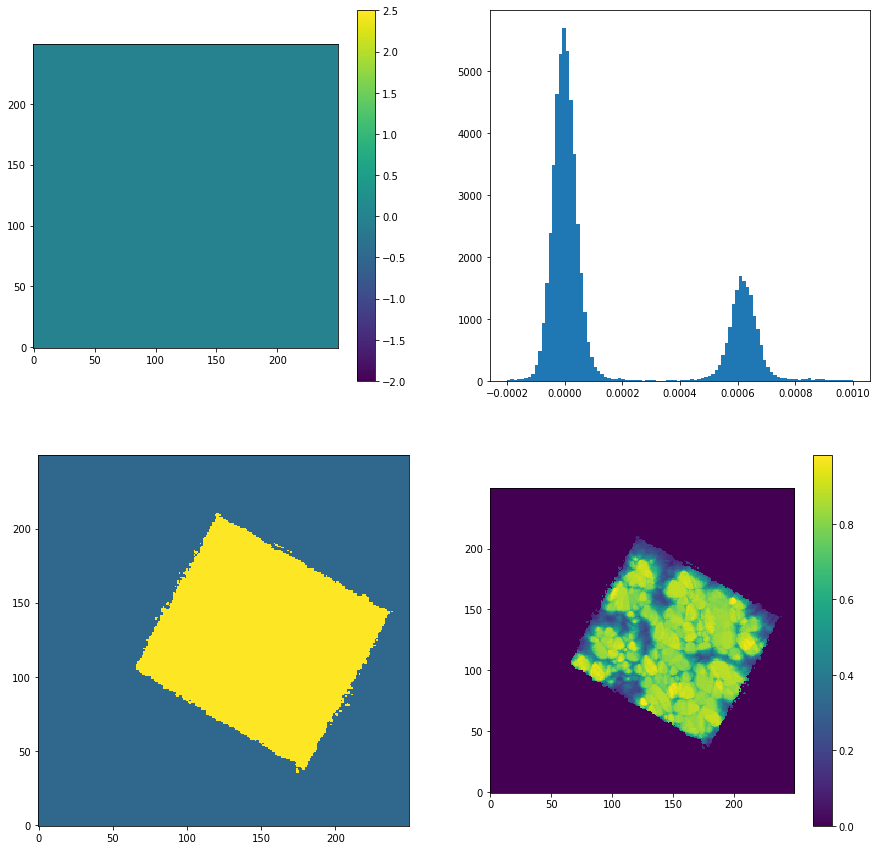

showing layer: 24
index is : 587


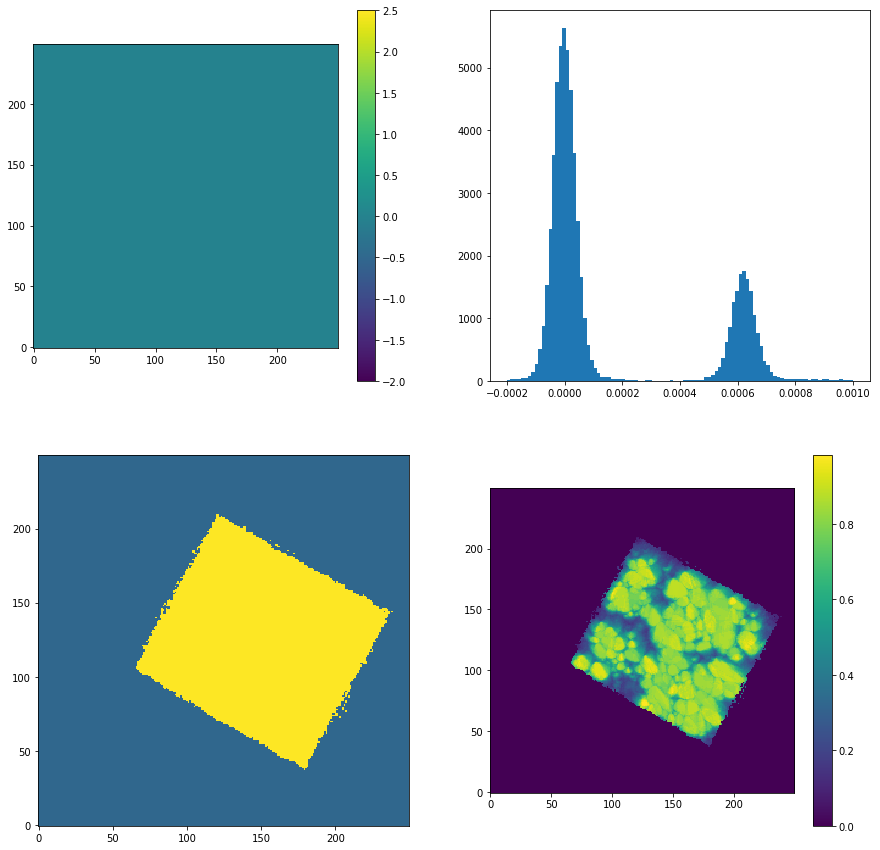

showing layer: 25
index is : 590


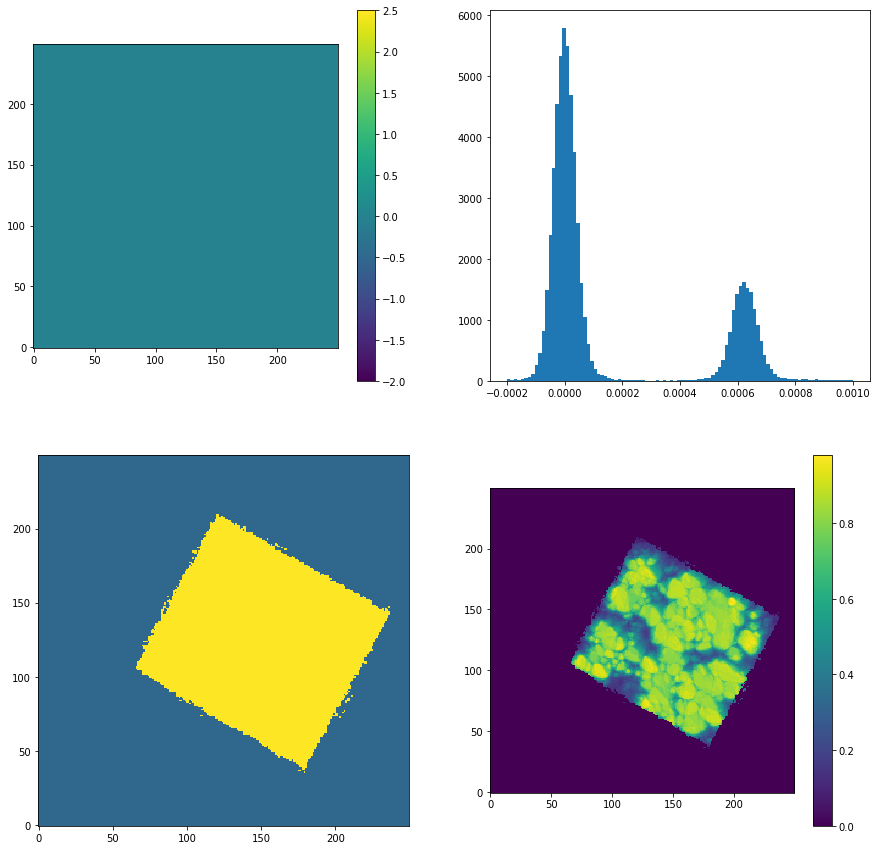

showing layer: 26
index is : 594


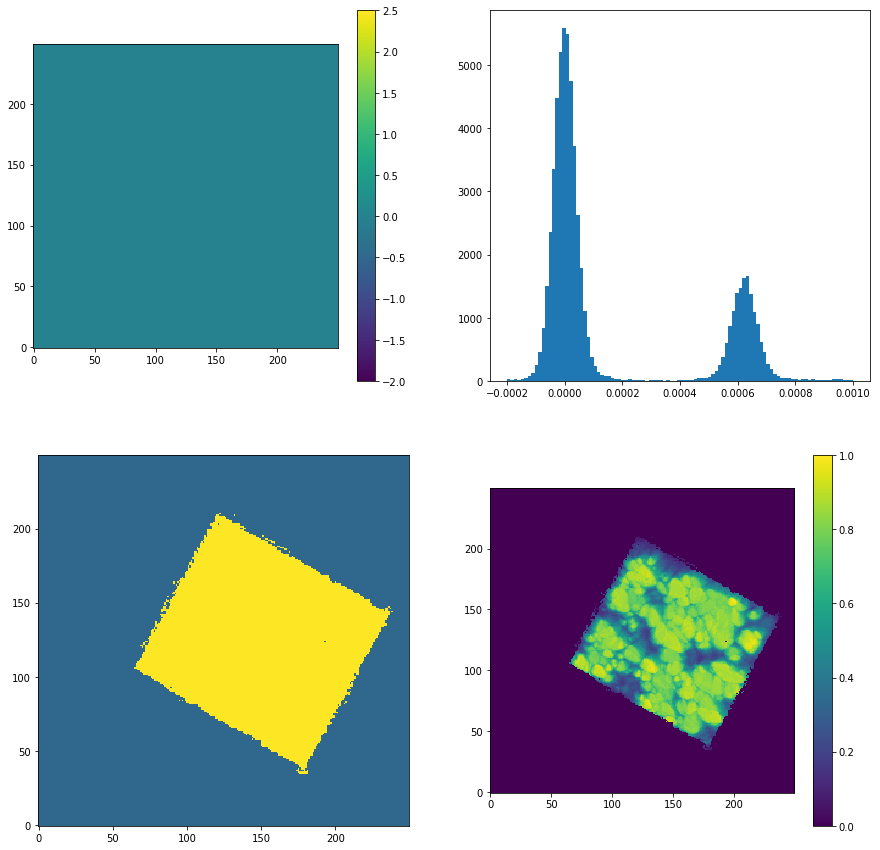

showing layer: 27
index is : 597


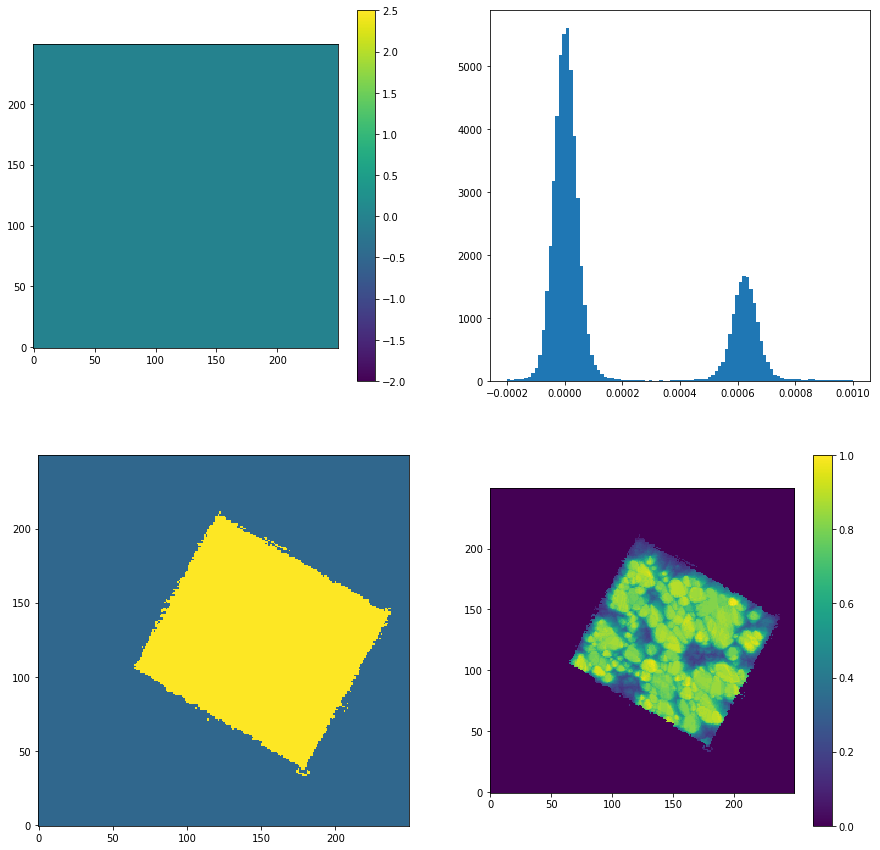

showing layer: 28
index is : 600


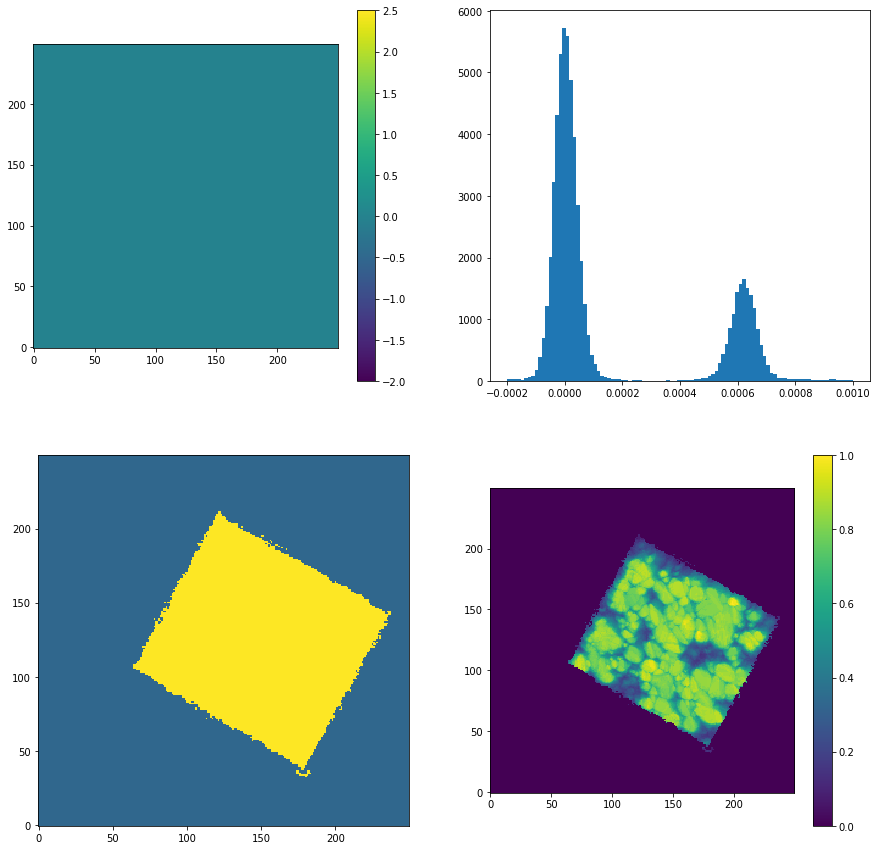

showing layer: 29
index is : 604


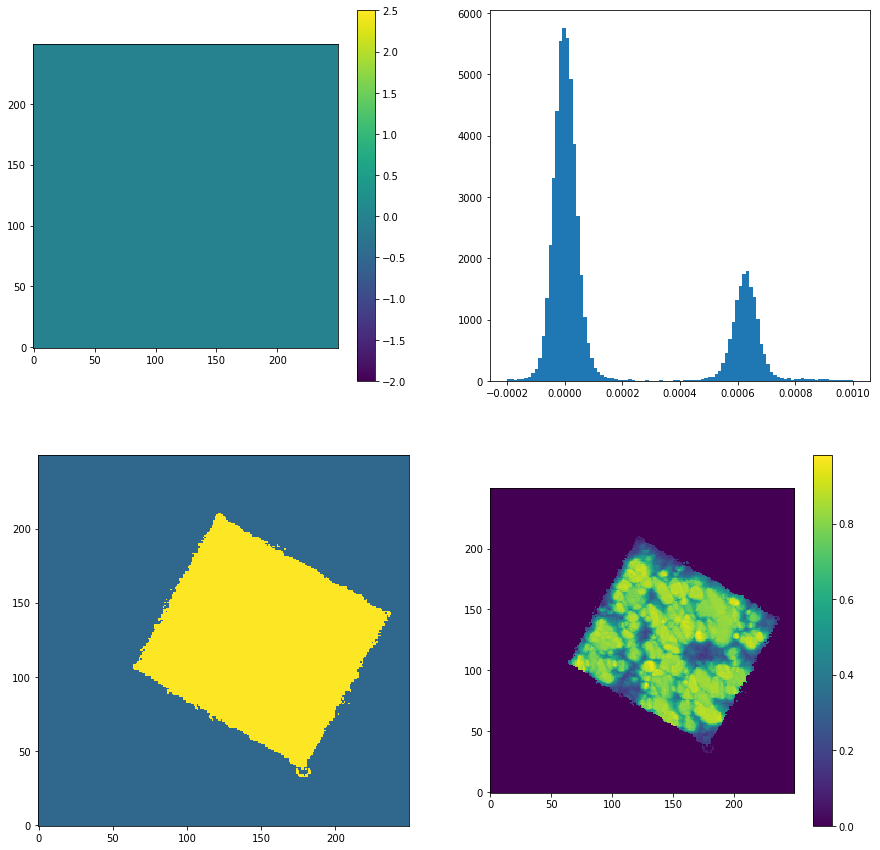

showing layer: 30
index is : 607


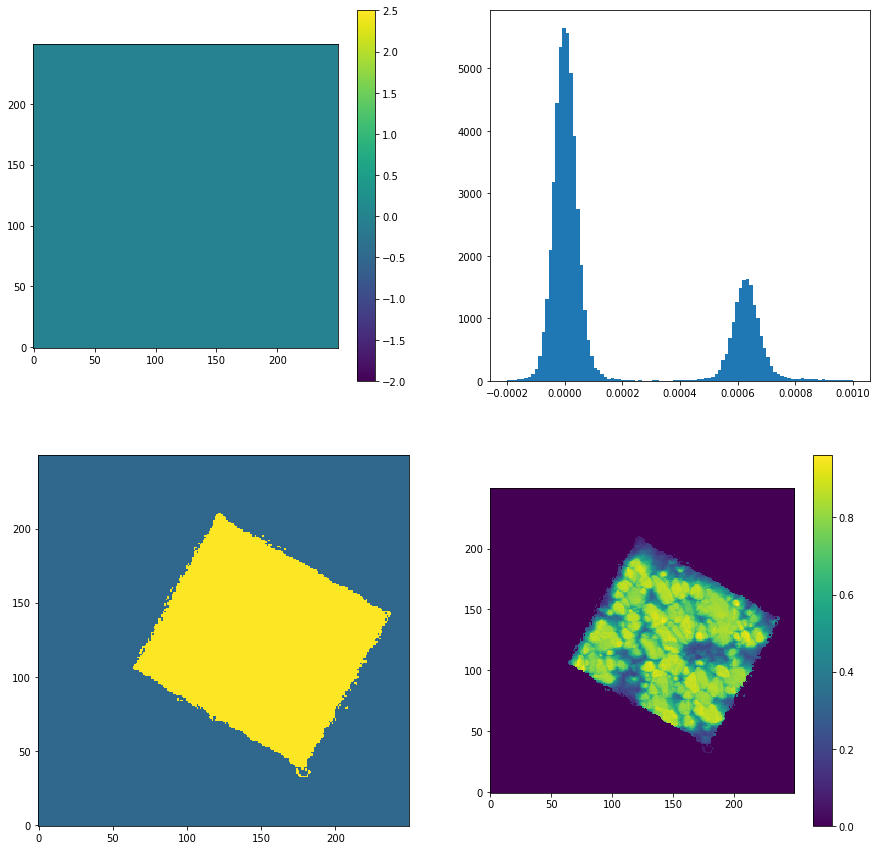

showing layer: 31
index is : 611


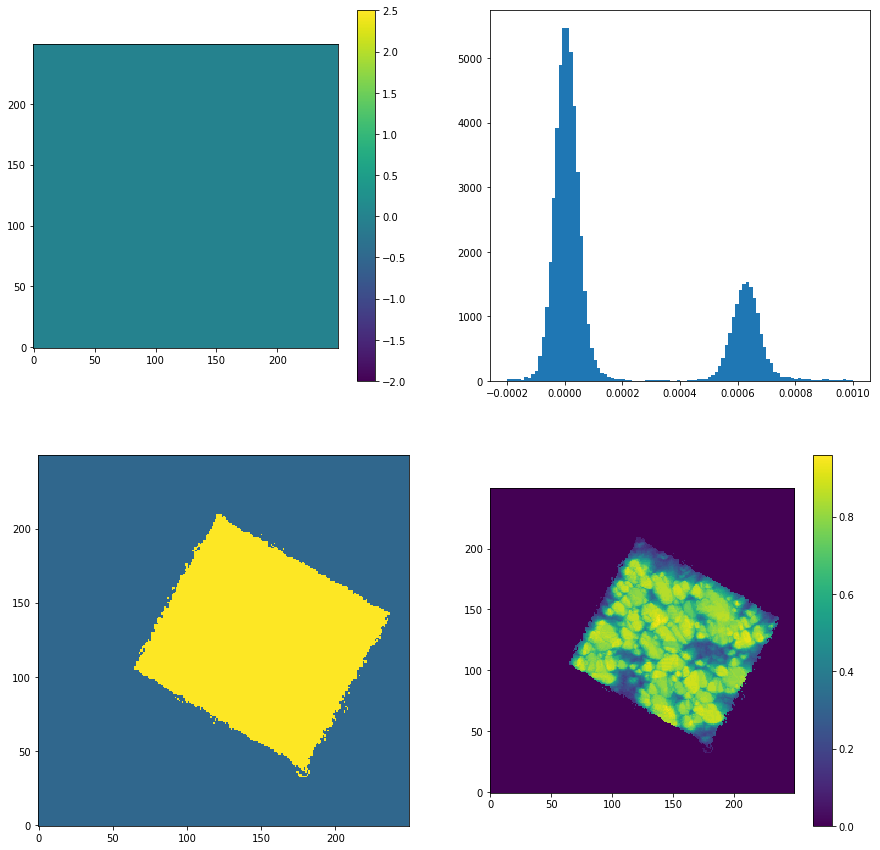

showing layer: 32
index is : 614


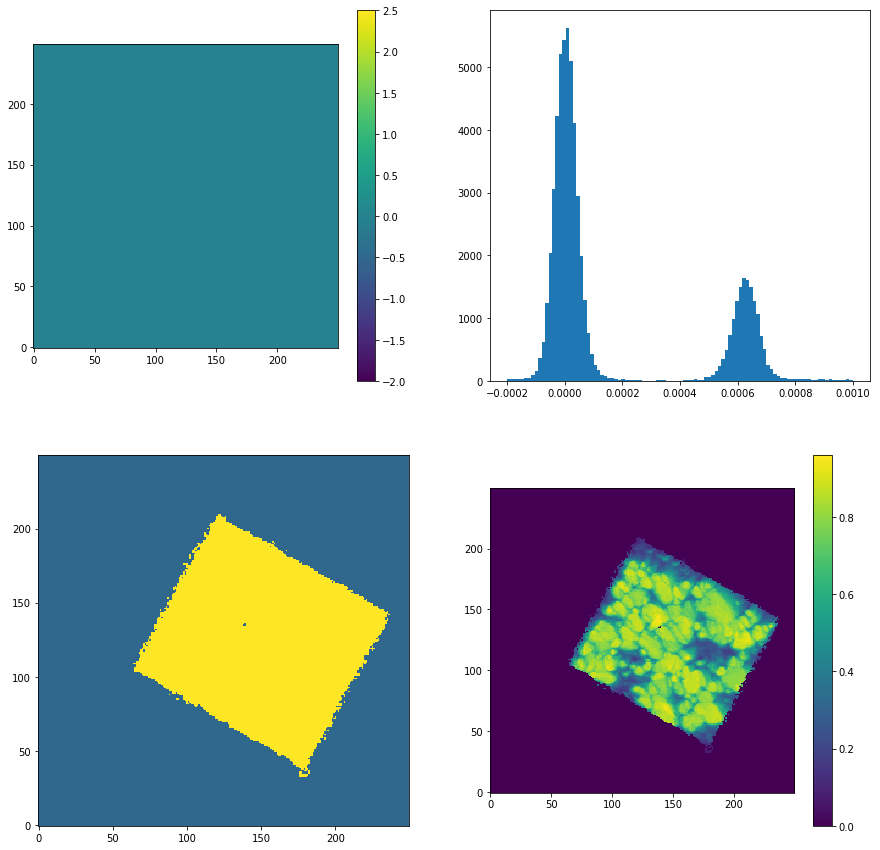

showing layer: 33
index is : 617


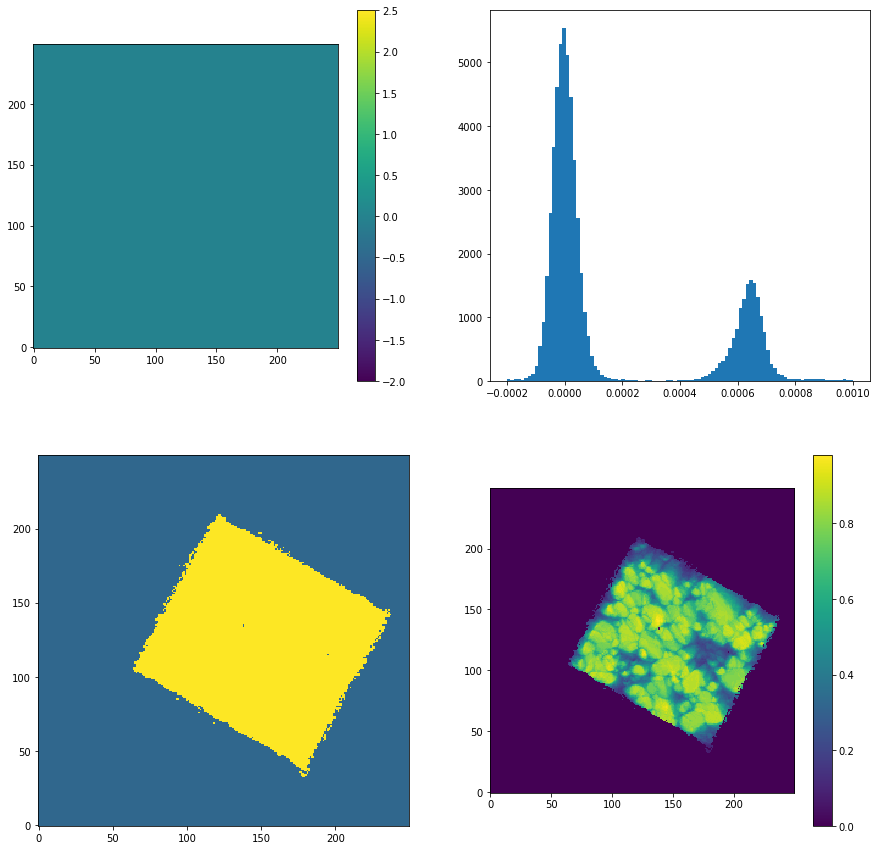

showing layer: 34
index is : 621


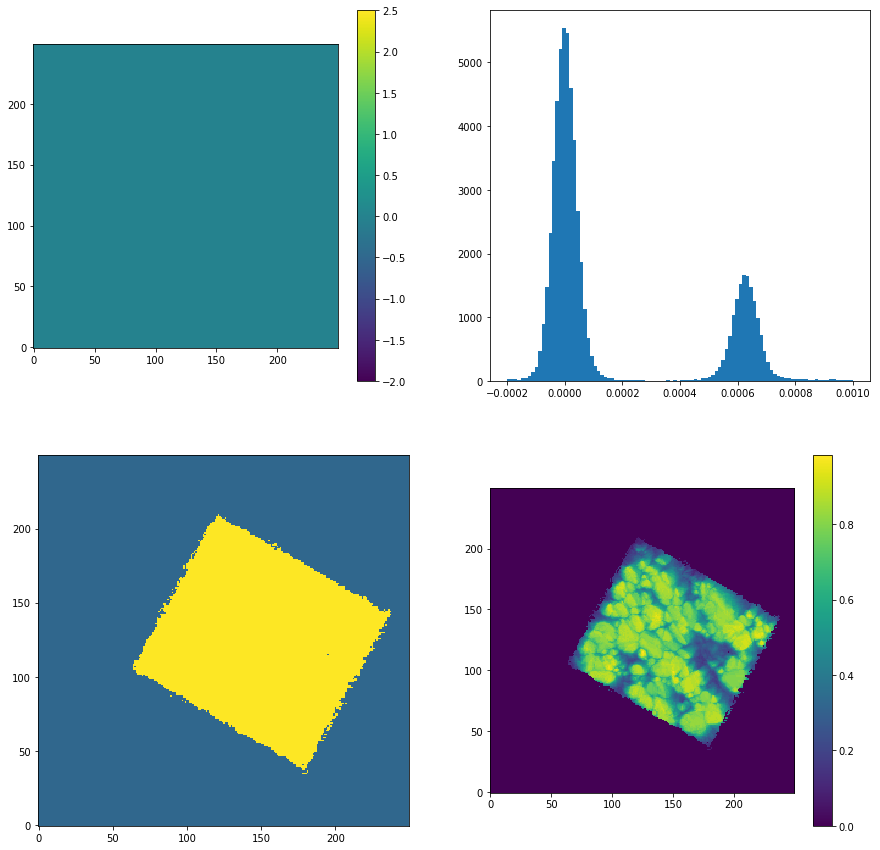

showing layer: 35
index is : 624


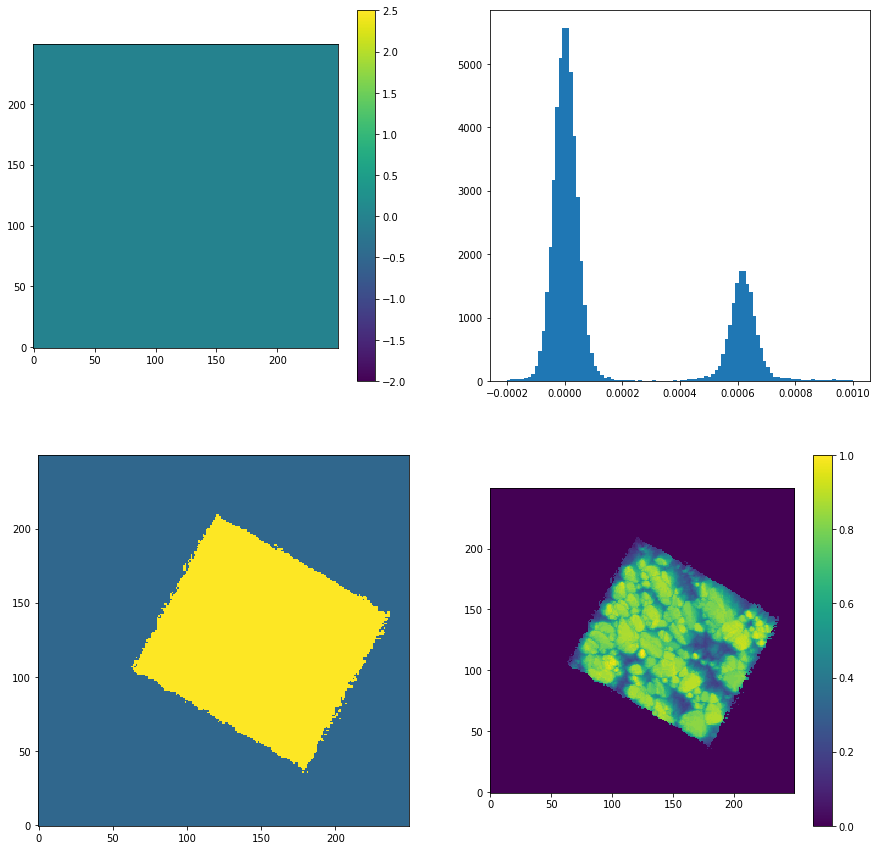

In [5]:
# nf HEDM combine with tomography
import matplotlib.pyplot as plt
import tifffile
import scipy.ndimage as ndi
import numpy as np
##############  experiemental parameters ############
# tomo
tomoCenterY = 12.615
beamCenterPixel = 565 # what is this
rotCenter = 1920/2 # just use half detector size
tomoStartPixel=0
tomoPixelSize = 0.00117
tomoInitial = '/home/heliu/work/suter_feb20/tomo/SS316_s1_cycle_3_cooldown_tomo/SS316_s1_cycle_3_cooldown_tomo__'
# nf 
yStart = 12.545      # first layer of nf HEDM
dY = 0.004          # y step in mm
threshold = 0.00025
initial = 'SS316_s1_cycle_3_cooldown_nf'
################ processing session ##################
tomoSlice = None
for layer in range(0, 36):
    print(f'showing layer: {layer}')
    idx = get_tomo_idx_by_layer(layer, yStart=yStart, dY=dY,
                                tomoCenterY=tomoCenterY, beamCenterPixel=beamCenterPixel,
                                tomoStartPixel=tomoStartPixel, pixelSize=tomoPixelSize)
    print(f'index is : {idx}')
    if tomoSlice is not None:
        tomoSliceOld = tomoSlice
    tomoSlice = tifffile.imread(f'{tomoInitial}{idx:05d}.tiff')
    tomoSlice = ndi.median_filter(tomoSlice,size=4)
    #print(tomoSlice)
    if np.isnan(tomoSlice).any():
        print(f'find nan in tomoSlice, reuse mask from last layer!!!!!')
        tomoSlice = tomoSliceOld
    raw, mask = tomo_2_mask(tomoSlice, threhold=0,
                            maskShape=[250,250], maskVoxelSize=0.004,maskShift=[0,0,0],
                           rotCenter=rotCenter,pixelSize=tomoPixelSize)
    #rawProcess = ndi.median_filter(raw,size=3)
    rawProcess = raw
    mask = rawProcess>threshold

    mic = np.load(f'{initial}_q9_rot720_z{layer}_250x250_0.004_shift_0.0_0.0_0.0.npy')
    
    # visualize 
    fig, axes = plt.subplots(2,2,figsize=(15,15))
    fig
    img0 = axes[0,0].imshow(raw.T, origin='lower',vmin=-2,vmax=2.5)
    plt.colorbar(img0, ax=axes[0,0])
    axes[0,1].hist(rawProcess.ravel(),bins=100,range=(-0.0002,0.001))
    axes[1,0].imshow(mask.T, origin='lower',vmin=-0.001,vmax=0.002)
    mic[:,:,6] = mic[:,:,6]*mask
    mic[:,:,7] = mask
    img3 = axes[1,1].imshow(mic[:,:,6].T, origin='lower')
    plt.colorbar(img3, ax=axes[1,1])
    plt.show()
    np.save(f'{initial}_q9_rot720_z{layer}_250x250_0.004_shift_0.0_0.0_0.0_cropped_by_tomo.npy', mic)
    

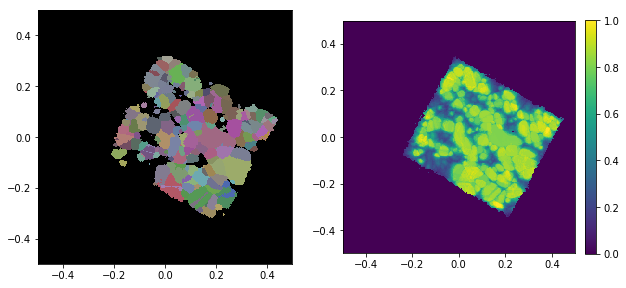

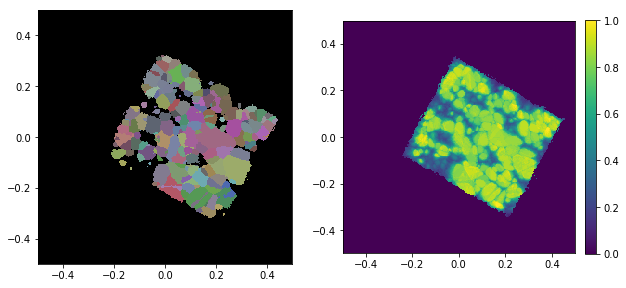

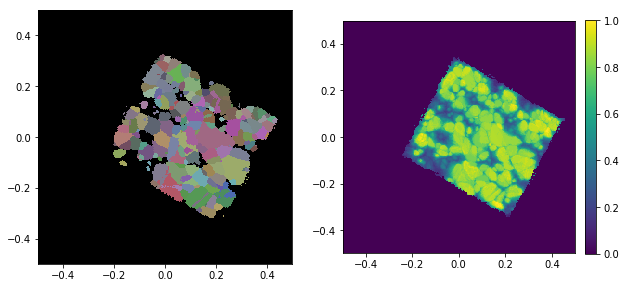

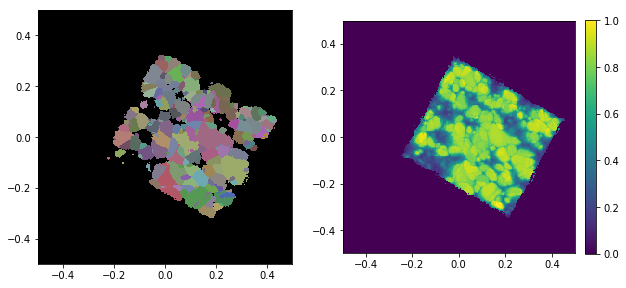

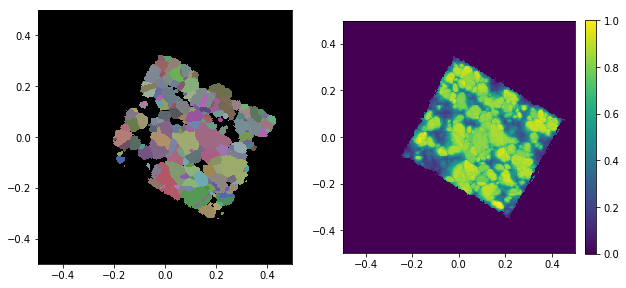

...

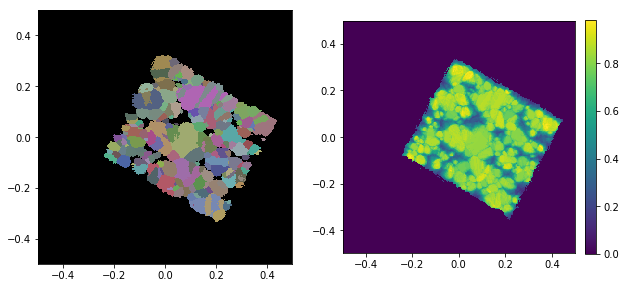

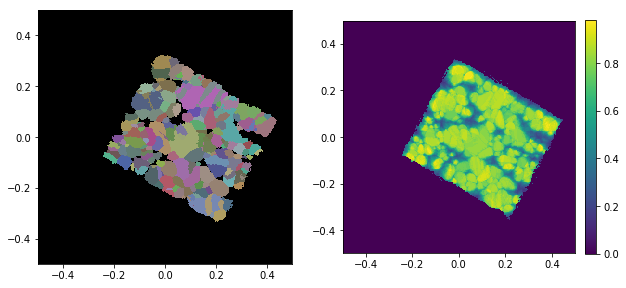

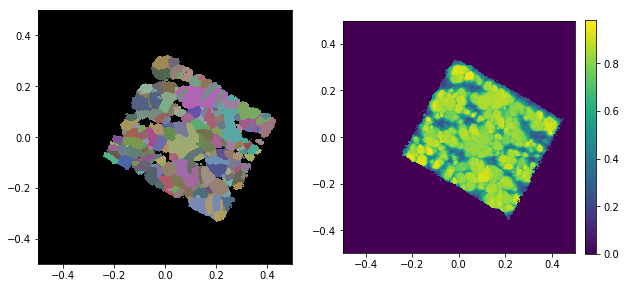

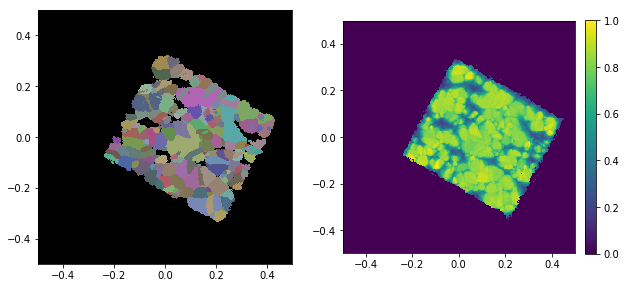

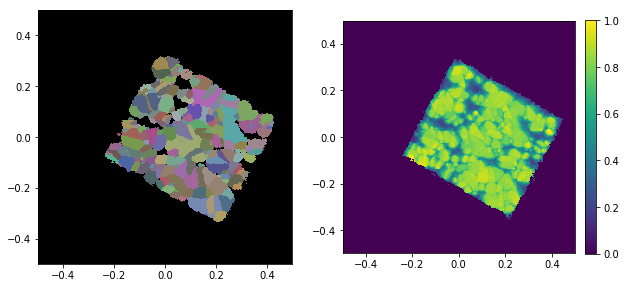

In [ ]:
for layer in range(36):
    mic = np.load(f'{initial}_q9_rot720_z{layer}_250x250_0.004_shift_0.0_0.0_0.0_cropped_by_tomo.npy')
    MicFileTool.plot_mic_and_conf(mic, 0.4)

# there is some registration off, reoptimize parameter:


Loading configuration from SS316_s1_cycle_3_cooldown_nf_z0_twiddle_1_0.921.yml
try to clean up gpu memory
maxQ: 9, minQ: 0, NG: 136
maxQ: 9, minQ: 0, NG: 136
exp data loaded, shape is: (22567181, 4)./heliu/work/suter_feb20/SS316_s1_cycle_3_cooldown_nf/reduction/SS316_s1_cycle_3_cooldown_nf/SS316_s1_cycle_3_cooldown_nf_binz17_000719.bin1
copy exp data to gpu memory ...
start create exp data in cpu ram ...
 reset searchBatchSize into 6000
start reconstruction ... 

Niter: 26, vIdx: 0000105, prog: 0000001/0002500, conf: 0.137255, pkcnt: 51, euler: [226.1255  69.144  138.2938]
 
number of flood fills: 221
start post processing, moving grain boundaries untile stable ...
number of post process iteration: 10, number of voxel revisited: 5978
post process takes is 28.967 seconds
reconstruction finished 

SourceModule time:  117.932 seconds.
saved as npy format: SS316_s1_cycle_3_cooldown_nf_q9_rot720_z17_50x50_0.004_shift_0.0_0.0_0.0.npy


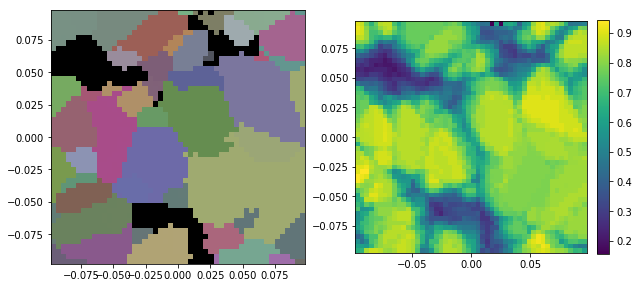

In [44]:
c = config.Config().load('SS316_s1_cycle_3_cooldown_nf_z0_twiddle_1_0.921.yml') # read configuration file, create a configuration class:d
c.micsize = np.array([50,50])
c.micVoxelSize = 0.004
c.fileBinLayerIdx = 17
#print(c)

S.load_config(c,reloadData=True)
S.serial_recon_multi_stage()
MicFileTool.plot_mic_and_conf(S.squareMicData, 0.4)

cnt: 0, current threhold is 0.8699999999999999
 loss: 0.1856, sumdp: 0.0508, L: [[5.6166 7.6166]], J: 1026.52 1043.68, K: 1991.13 1986.16...   .1906 126.5569]
 loss: 0.1742, sumdp: 0.0391, L: [[5.6166 7.6166]], J: 1026.52 1043.68, K: 1991.13 1988.14...   .2252 126.5477]
 loss: 0.1741, sumdp: 0.0191, L: [[5.6166 7.6166]], J: 1025.59 1043.68, K: 1991.13 1988.14...   .1906 126.5569]
 loss: 0.1735, sumdp: 0.0141, L: [[5.6166 7.6166]], J: 1025.59 1043.68, K: 1991.13 1987.10...   .2146 126.4857]
 loss: 0.1721, sumdp: 0.0139, L: [[5.6166 7.6166]], J: 1025.59 1042.54, K: 1991.13 1987.10...   .1906 126.5569]
 loss: 0.1719, sumdp: 0.0053, L: [[5.6166 7.6166]], J: 1025.59 1042.54, K: 1991.13 1987.60...   .2031 126.4184]
 loss: 0.1713, sumdp: 0.0053, L: [[5.6166 7.6166]], J: 1025.59 1042.54, K: 1991.13 1987.05...   .1906 126.5569]
 loss: 0.1707, sumdp: 0.0052, L: [[5.6166 7.6166]], J: 1025.59 1042.54, K: 1991.13 1987.65...   .1906 126.5569]
 loss: 0.1704, sumdp: 0.0053, L: [[5.6187 7.6187]], J: 10

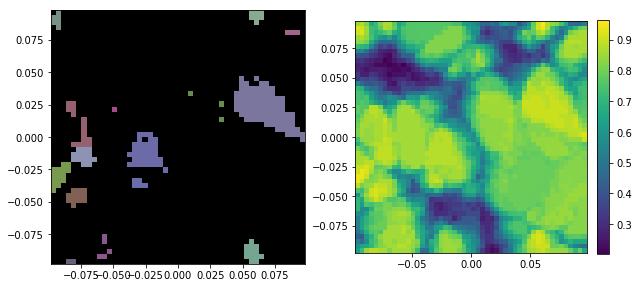

[[5.6179 7.6179]] [[1025.5929 1042.5401]] [[1991.1331 1987.6495]] [[[89.0326 89.5333 -0.4426]
  [88.9675 89.4702 -0.4687]]]
SS316_s1_cycle_3_cooldown_nf_z17_twiddle_0_0.906.yml
cnt: 1, current threhold is 0.8699999999999999
 loss: 0.1366, sumdp: 0.0689, L: [[5.6179 7.6179]], J: 1025.59 1042.54, K: 1991.13 1989.45...   .3561 249.9245]
 loss: 0.1115, sumdp: 0.0642, L: [[5.6179 7.6179]], J: 1025.59 1042.54, K: 1991.13 1987.47...   .3561 249.9245]
 loss: 0.1113, sumdp: 0.0225, L: [[5.6179 7.6179]], J: 1024.32 1042.54, K: 1991.13 1987.47...   .3561 249.9245]
Niter: 00, vIdx: 0000097, prog: 0000000/0002500, conf: 0.888889, pkcnt: 54, euler: [114.4154  17.3561 249.9245]

KeyboardInterrupt: 

In [45]:
S.auto_twiddle(0.95)

In [48]:
# after reconstruction of the whole stack.
# save cropped into tiffstack and ang stack
from hexomap import recon_format
lNpyFile = []
folder = './'
initial = 'SS316_s1_cycle_3_cooldown_nf'
for layer in range(0,36):
    lNpyFile.append(f'{folder}{initial}_q9_rot720_z{layer}_250x250_0.004_shift_0.0_0.0_0.0_cropped_by_tomo.npy')
tiff_stack_initial = f'{folder}{initial}_tiff_stack/{initial}'
ang_stack_initial = f'{folder}{initial}_ang_stack/{initial}'
recon_format.npy_2_tiffstack(lNpyFile, tiff_stack_initial, minHitRatio=0.4,startIdx=1)
recon_format.npy_2_ang(lNpyFile,
                       ang_stack_initial,
                       sample='stanless_steel',
                       startIdx=1)

processing layer 0: ./SS316_s1_cycle_3_cooldown_nf_q9_rot720_z0_250x250_0.004_shift_0.0_0.0_0.0_cropped_by_tomo.npy
./SS316_s1_cycle_3_cooldown_nf_tiff_stack/SS316_s1_cycle_3_cooldown_nf_1.TIFF
processing layer 1: ./SS316_s1_cycle_3_cooldown_nf_q9_rot720_z1_250x250_0.004_shift_0.0_0.0_0.0_cropped_by_tomo.npy
./SS316_s1_cycle_3_cooldown_nf_tiff_stack/SS316_s1_cycle_3_cooldown_nf_2.TIFF
processing layer 2: ./SS316_s1_cycle_3_cooldown_nf_q9_rot720_z2_250x250_0.004_shift_0.0_0.0_0.0_cropped_by_tomo.npy
./SS316_s1_cycle_3_cooldown_nf_tiff_stack/SS316_s1_cycle_3_cooldown_nf_3.TIFF
processing layer 3: ./SS316_s1_cycle_3_cooldown_nf_q9_rot720_z3_250x250_0.004_shift_0.0_0.0_0.0_cropped_by_tomo.npy
./SS316_s1_cycle_3_cooldown_nf_tiff_stack/SS316_s1_cycle_3_cooldown_nf_4.TIFF
processing layer 4: ./SS316_s1_cycle_3_cooldown_nf_q9_rot720_z4_250x250_0.004_shift_0.0_0.0_0.0_cropped_by_tomo.npy
./SS316_s1_cycle_3_cooldown_nf_tiff_stack/SS316_s1_cycle_3_cooldown_nf_5.TIFF
processing layer 5: ./SS316_s1